# Experiments

## Find zero atol in confidence interval estimation
Increasing find_zero_atol strictly decreases the number of LL evaluations because it strictly decreases the number of optimisation calls. This occurs after around 1e-14.
Increasing opt_abstol decreases the number of LL evaluations in general. However, if it gets too high then the optimiser will not find the true profile ll at each location and resultantly the number of optimisation calls may increase, either increasing the number of LL evaluations or making the magnitude of the decrease smaller.

In [2]:
using Logging
Logging.disable_logging(Logging.Warn) # Disable debug, info and warn

LogLevel(1001)

In [2]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
output_location = joinpath("Outputs", "logistic")
data_df = CSV.read(joinpath(output_location, "confidence_interval_ll_calls.csv"), DataFrame);
data_df_zero = filter(row -> row.find_zero_atol == 0.0, data_df)

data_df_zero.log10_opt_abstol = [val == 0.0 ? -25 : log10(val) for val in data_df_zero.opt_abstol]

format = (palette=:Paired, msw=0, size=(350, 430), dpi=300, title="")

plt1 = @df data_df_zero scatter(:log10_opt_abstol, :likelihood_calls; group=:parameter, alpha=0.8, legend_position=nothing, format...);
# ylabel!("Total Likelihood Calls")
# savefig(plt, joinpath(output_location, "conf_int_likelihood_calls_vs_abstol.pdf"))

plt2 = @df data_df_zero scatter(:log10_opt_abstol, :optimisation_calls; group=:parameter, alpha=0.8, legend_position=nothing, format...);
xlabel!(L"log_{10}(\texttt{abstol})");
# ylabel!("Total Optimisation Calls\n")

plt = plot(plt1, plt2, layout=grid(2, 1))
savefig(plt, joinpath(output_location, "conf_int_calls_vs_abstol.pdf"))

data_df_zero = filter(row -> row.opt_abstol == 0.0, data_df);

data_df_zero.log10_find_zero_atol = [val == 0.0 ? -25 : log10(val) for val in data_df_zero.find_zero_atol]

plt1 = @df data_df_zero scatter(:log10_find_zero_atol, :likelihood_calls; group=:parameter, alpha=0.8, legend_position=nothing, format...);
# xlabel!(L"log_{10}(\texttt{atol})")
ylabel!("Total Likelihood Calls")
# savefig(plt, joinpath(output_location, "conf_int_likelihood_calls_vs_atol.pdf"))

plt2 = @df data_df_zero scatter(:log10_find_zero_atol, :optimisation_calls; group=:parameter, alpha=0.8, legend_position=nothing, format...);
xlabel!(L"log_{10}(\texttt{atol})");
ylabel!("Total Optimisation Calls\n")
# savefig(plt, joinpath(output_location, "conf_int_optimisation_calls_vs_atol.pdf"))


plt = plot(plt1, plt2, layout=grid(2, 1))
savefig(plt, joinpath(output_location, "conf_int_calls_vs_atol.pdf"))
# ggplot(aes(x=opt_abstol, y=likelihood_calls)) + 
# geom_point(aes(colour=parameter)) +
# scale_x_continuous(trans="log10") +

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\logistic\\conf_int_calls_vs_atol.pdf"

### xtol_rel for optimisation instead of atol

If we instead focus on xtol_rel instead of atol for convergence 

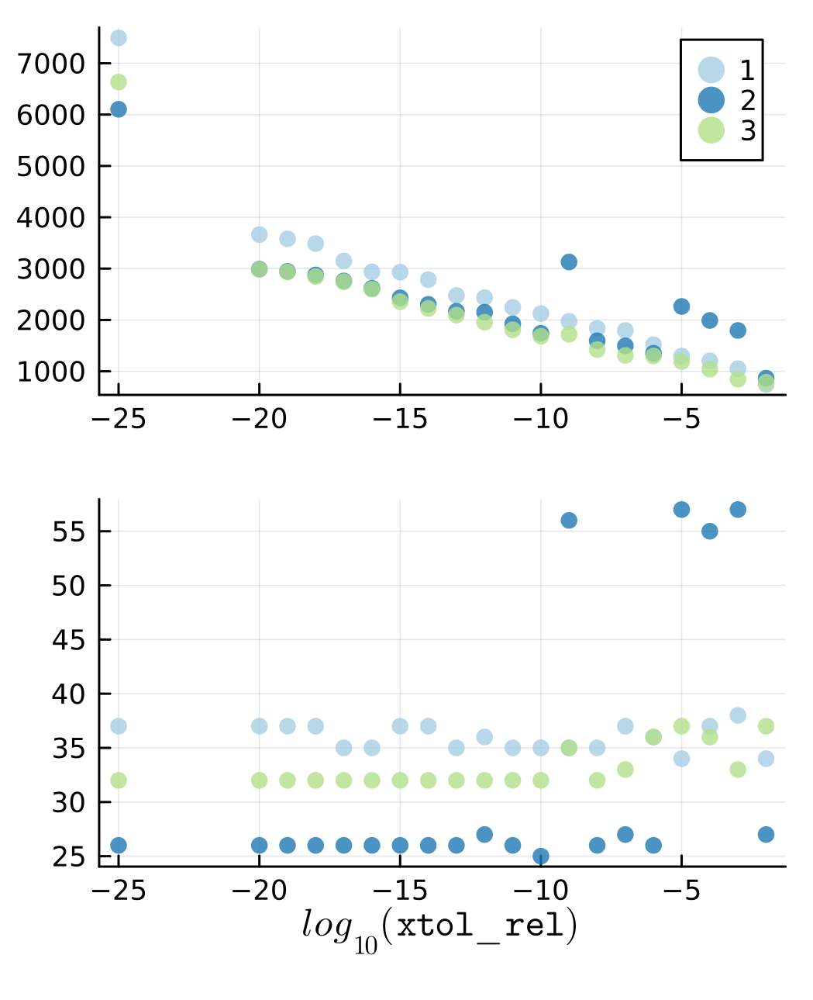

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\logistic\\conf_int_calls_vs_xtol_rel.pdf"

In [45]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays
output_location = joinpath("Outputs", "logistic")
data_df = CSV.read(joinpath(output_location, "confidence_interval_ll_calls_xtol_rel.csv"), DataFrame);
data_df_zero = filter(row -> row.find_zero_atol == 0.0, data_df)

data_df_zero.log10_xtol_rel = [val == 0.0 ? -25 : log10(val) for val in data_df_zero.xtol_rel]

format = (palette=:Paired, msw=0, size=(350, 430), dpi=300, title="")

plt1 = @df data_df_zero scatter(:log10_xtol_rel, :likelihood_calls; group=:parameter, alpha=0.8, legend_position=:topright, format...);
# ylabel!("Total Likelihood Calls")
# savefig(plt, joinpath(output_location, "conf_int_likelihood_calls_vs_abstol.pdf"))

plt2 = @df data_df_zero scatter(:log10_xtol_rel, :optimisation_calls; group=:parameter, alpha=0.8, legend_position=nothing, format...);
xlabel!(L"log_{10}(\texttt{xtol}\_\texttt{rel})");
# ylabel!("Total Optimisation Calls\n")

plt = plot(plt1, plt2, layout=grid(2, 1))
display(plt)
savefig(plt, joinpath(output_location, "conf_int_calls_vs_xtol_rel.pdf"))


### If have already found a higher or lower confidence interval

In [38]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
output_location = joinpath("Outputs", "logistic")
data_df = CSV.read(joinpath(output_location, "confidence_interval_ll_calls_lower_and_upper.csv"), DataFrame);


format = (palette=:Paired, msw=0, size=(430, 430), dpi=300, title="");

using CategoricalArrays
par_names = ["λ", "K", "C0"]
data_df.par_str = categorical(par_names[data_df.parameter], levels=par_names)

data_df.name_cat .= categorical(data_df.name; levels=["Baseline", "Lower", "Higher", "Lower and Higher"])

plt1 = @df data_df groupedbar(:par_str, :likelihood_calls; bar_position=:dodge, group=:name_cat, legend_position=nothing, format...);
ylabel!("Total Likelihood Calls")

plt2 = @df data_df groupedbar(:par_str, :optimisation_calls; bar_position=:dodge, group=:name_cat, legend_position=:bottomright, format...);
ylabel!("Total Optimisation Calls")

savefig(plt1, joinpath(output_location, "conf_int_like_calls_vs_lu.pdf"))
savefig(plt2, joinpath(output_location, "conf_int_opt_calls_vs_lu.pdf"))

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\logistic\\conf_int_opt_calls_vs_lu.pdf"

### If using EllipseApproxAnalytical as one side of the bracket

In [8]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
output_location = joinpath("Outputs", "logistic")
data_df = CSV.read(joinpath(output_location, "confidence_interval_ll_calls_lower_and_upper.csv"), DataFrame);

data_df_baseline = filter(row -> row.name == "Baseline", data_df)
select!(data_df_baseline, Not([:lower_found, :upper_found]))

data_df_both = CSV.read(joinpath(output_location, "confidence_interval_ll_calls_ellipseapprox_start.csv"), DataFrame);
data_df_both.name .= "Replace Either"

data_df_outer = CSV.read(joinpath(output_location, "confidence_interval_ll_calls_ellipseapprox_start_outeronly.csv"), DataFrame);
data_df_outer.name .= "Replace Outer"

data_df = vcat(data_df_baseline, data_df_both)
data_df = vcat(data_df, data_df_outer)

format = (palette=:Paired, msw=0, size=(430, 430), dpi=300, title="");
using CategoricalArrays
par_names = ["λ", "K", "C0"]
data_df.par_str = categorical(par_names[data_df.parameter], levels=par_names)

data_df.name_cat .= categorical(data_df.name; levels=["Baseline", "Replace Outer", "Replace Either"])

plt1 = @df data_df groupedbar(:par_str, :likelihood_calls; bar_position=:dodge, group=:name_cat, legend_position=nothing, format...);
ylabel!("Total Likelihood Calls")

plt2 = @df data_df groupedbar(:par_str, :optimisation_calls; bar_position=:dodge, group=:name_cat, legend_position=:bottomright, format...);
ylabel!("Total Optimisation Calls")

savefig(plt1, joinpath(output_location, "conf_int_like_calls_vs_ellipsestart.pdf"))
savefig(plt2, joinpath(output_location, "conf_int_opt_calls_vs_ellipsestart.pdf"))

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\logistic\\conf_int_opt_calls_vs_ellipsestart.pdf"

# Coverage Outputs

## Parameter Confidence Intervals

In [1]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays

format = (msw=1.5, size=(500, 400), dpi=300, title="", legend_position=nothing, ylabel="Simulated Coverage");
locs = ["logistic", "lotka_volterra", "logistic_twospecies", "logistic_twospecies_logitnormal"]

loc = locs[1]
output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "univariate_parameter_coverage.csv"), DataFrame);
# data_df.θname = categorical(data_df.θname, levels=data_df.θname)

plt = @df data_df plot(:θname, :coverage; st=:bar, color=palette(:Paired)[1:nrow(data_df)], ylimits=(0.8, 1.0), yticks=LinRange(0.8, 1.0, 5),
    yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);
annotate!(data_df.θname, fill(0.8, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))


savefig(plt, joinpath(output_location, "univariate_parameter_coverage_" * loc * ".pdf"))

loc = locs[2]
output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "univariate_parameter_coverage.csv"), DataFrame);
# data_df.θname = categorical(data_df.θname, levels=data_df.θname)

plt = @df data_df plot(:θname, :coverage; st=:bar, color=palette(:Paired)[1:nrow(data_df)], bar_position=:stack, ylimits=(0.8, 1.0), yticks=LinRange(0.8, 1.0, 5),
    yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);
annotate!(data_df.θname, fill(0.8, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))

savefig(plt, joinpath(output_location, "univariate_parameter_coverage_" * loc * ".pdf"))

loc = locs[3]
output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "univariate_parameter_coverage.csv"), DataFrame);
# data_df.θname = categorical(data_df.θname, levels=data_df.θname)

plt = @df data_df plot(:θname, :coverage; st=:bar, color=palette(:Paired)[1:nrow(data_df)], bar_position=:stack, ylimits=(0.6, 1.0), yticks=LinRange(0.6, 1.0, 9),
    yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);

annotate!(data_df.θname, fill(0.6, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))
savefig(plt, joinpath(output_location, "univariate_parameter_coverage_" * loc * ".pdf"))

output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "univariate_parameter_coverage_significantly_more_data.csv"), DataFrame);
# data_df.θname = categorical(data_df.θname, levels=data_df.θname)

plt = @df data_df plot(:θname, :coverage; st=:bar, color=palette(:Paired)[1:nrow(data_df)], bar_position=:stack, ylimits=(0.6, 1.0), yticks=LinRange(0.6, 1.0, 9),
    yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);

annotate!(data_df.θname, fill(0.6, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))

display(data_df)
savefig(plt, joinpath(output_location, "univariate_parameter_coverage_" * loc * "significantly_more_data.pdf"))


loc = locs[4]
output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "univariate_parameter_coverage.csv"), DataFrame);
# data_df.θname = categorical(data_df.θname, levels=data_df.θname)

plt = @df data_df plot(:θname, :coverage; st=:bar, color=palette(:Paired)[1:nrow(data_df)], bar_position=:stack, ylimits=(0.6, 1.0), yticks=LinRange(0.6, 1.0, 9),
    yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);

annotate!(data_df.θname, fill(0.6, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))
savefig(plt, joinpath(output_location, "univariate_parameter_coverage_" * loc * ".pdf"))

output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "univariate_parameter_coverage_significantly_more_data.csv"), DataFrame);
# data_df.θname = categorical(data_df.θname, levels=data_df.θname)

plt = @df data_df plot(:θname, :coverage; st=:bar, color=palette(:Paired)[1:nrow(data_df)], bar_position=:stack, ylimits=(0.6, 1.0), yticks=LinRange(0.6, 1.0, 9),
    yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);

annotate!(data_df.θname, fill(0.6, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))

display(data_df)
savefig(plt, joinpath(output_location, "univariate_parameter_coverage_" * loc * "significantly_more_data.pdf"))



# loc = locs[4]
# output_location = joinpath("Outputs", loc)
# data_df = CSV.read(joinpath(output_location, "univariate_parameter_coverage_higher_threshold.csv"), DataFrame);
# # data_df.θname = categorical(data_df.θname, levels=data_df.θname)

# plt = @df data_df plot(:θname, :coverage; st=:bar, color=palette(:Paired)[1:nrow(data_df)], bar_position=:stack, ylimits=(0.6, 1.0), yticks=LinRange(0.6, 1.0, 9),
#     yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);

# annotate!(data_df.θname, fill(0.6, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))

# display(data_df)
# savefig(plt, joinpath(output_location, "univariate_parameter_coverage_" * loc * "_higher_threshold.pdf"))

┌ Warning: Indices Base.OneTo(3) of attribute `seriescolor` does not match data indices 2:9.
└ @ Plots C:\Users\joelt\.julia\packages\Plots\sxUvK\src\utils.jl:141
┌ Info: Data contains NaNs or missing values, and indices of `seriescolor` vector do not match data indices.
│ If you intend elements of `seriescolor` to apply to individual NaN-separated segments in the data,
│ pass each segment in a separate vector instead, and use a row vector for `seriescolor`. Legend entries
│ may be suppressed by passing an empty label.
│ For example,
│     plot([1:2,1:3], [[4,5],[3,4,5]], label=["y" ""], seriescolor=[1 2])
└ @ Plots C:\Users\joelt\.julia\packages\Plots\sxUvK\src\utils.jl:143
┌ Warning: Indices Base.OneTo(3) of attribute `fillcolor` does not match data indices 2:9.
└ @ Plots C:\Users\joelt\.julia\packages\Plots\sxUvK\src\utils.jl:141
┌ Info: Data contains NaNs or missing values, and indices of `fillcolor` vector do not match data indices.
│ If you intend elements of `fillcolor` to apply

Row,θname,θindex,coverage,coverage_lb,coverage_ub
,String3,Int64,Float64,Float64,Float64
1,λ1,1,0.942,0.925664,0.955667
2,λ2,2,0.951,0.935734,0.963533
3,δ,3,0.945,0.929008,0.958301
4,K,4,0.959,0.944788,0.97042
5,C01,5,0.938,0.92122,0.952138
6,C02,6,0.948,0.932365,0.960923
7,σ1,7,0.933,0.91569,0.947702


┌ Warning: Keyword argument bar_position not supported with Plots.GRBackend().  Choose from: annotationcolor, annotationfontfamily, annotationfontsize, annotationhalign, annotationrotation, annotations, annotationvalign, arrow, aspect_ratio, axis, background_color, background_color_inside, background_color_outside, background_color_subplot, bar_width, bins, bottom_margin, camera, clims, color_palette, colorbar, colorbar_entry, colorbar_scale, colorbar_title, colorbar_titlefont, colorbar_titlefontcolor, colorbar_titlefontrotation, colorbar_titlefontsize, connections, contour_labels, discrete_values, fill, fill_z, fillalpha, fillcolor, fillrange, fillstyle, flip, fontfamily, fontfamily_subplot, foreground_color, foreground_color_axis, foreground_color_border, foreground_color_grid, foreground_color_subplot, foreground_color_text, formatter, framestyle, grid, gridalpha, gridlinewidth, gridstyle, group, guide, guidefont, guidefontcolor, guidefontfamily, guidefonthalign, guidefontrotation, 

Row,θname,θindex,coverage,coverage_lb,coverage_ub
,String3,Int64,Float64,Float64,Float64
1,λ1,1,0.941,0.924551,0.954787
2,λ2,2,0.945,0.929008,0.958301
3,δ,3,0.936,0.919005,0.950367
4,K,4,0.94,0.92344,0.953905
5,C01,5,0.946,0.930126,0.959177
6,C02,6,0.941,0.924551,0.954787
7,σ,7,0.945,0.929008,0.958301


┌ Info: Data contains NaNs or missing values, and indices of `fillcolor` vector do not match data indices.
│ If you intend elements of `fillcolor` to apply to individual NaN-separated segments in the data,
│ pass each segment in a separate vector instead, and use a row vector for `fillcolor`. Legend entries
│ may be suppressed by passing an empty label.
│ For example,
│     plot([1:2,1:3], [[4,5],[3,4,5]], label=["y" ""], fillcolor=[1 2])
└ @ Plots C:\Users\joelt\.julia\packages\Plots\sxUvK\src\utils.jl:143
┌ Warning: Indices Base.OneTo(7) of attribute `seriescolor` does not match data indices 2:21.
└ @ Plots C:\Users\joelt\.julia\packages\Plots\sxUvK\src\utils.jl:141
┌ Info: Data contains NaNs or missing values, and indices of `seriescolor` vector do not match data indices.
│ If you intend elements of `seriescolor` to apply to individual NaN-separated segments in the data,
│ pass each segment in a separate vector instead, and use a row vector for `seriescolor`. Legend entries
│ may be

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\logistic_twospecies_logitnormal\\univariate_parameter_coverage_logistic_twospecies_logitnormalsignificantly_more_data.pdf"

## Bivariate Boundary Area Coverage
### Logistic example
Focusing on 95% lower quantile performance, i.e. in 95% of cases it will be at least 'this' good.

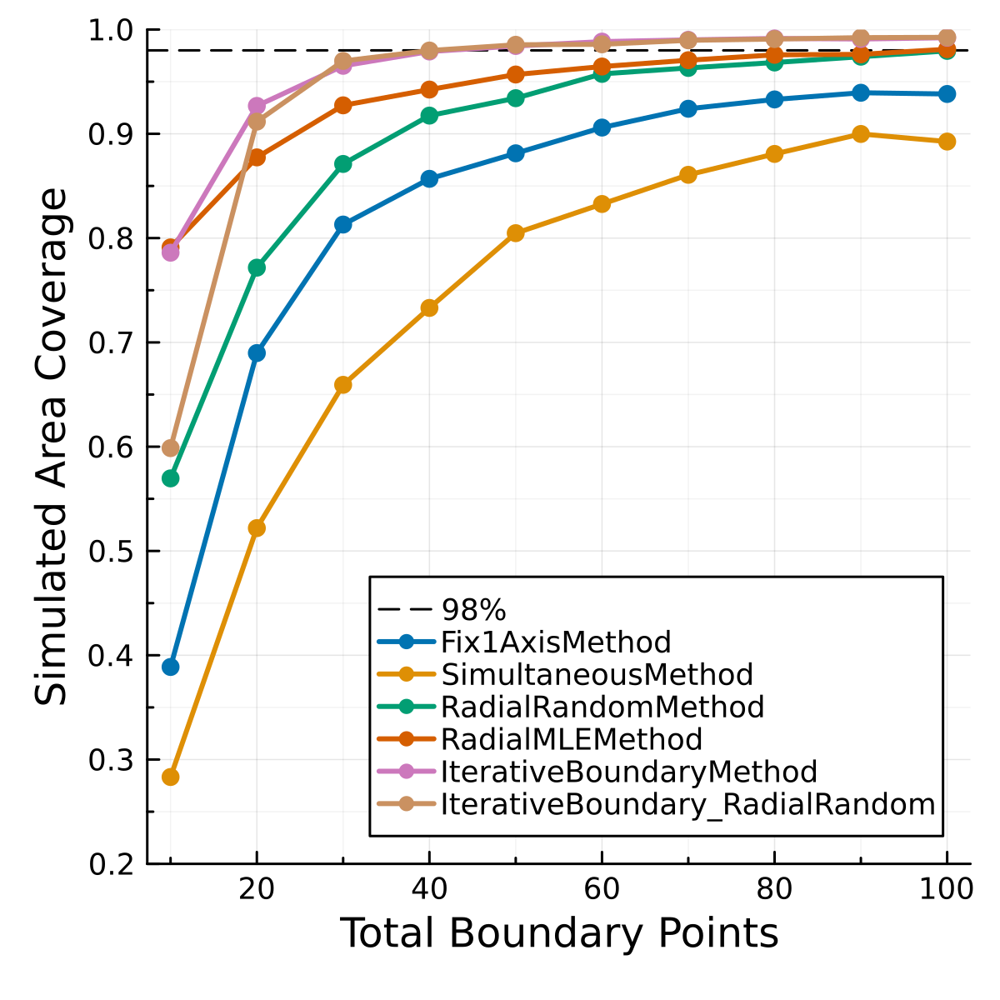

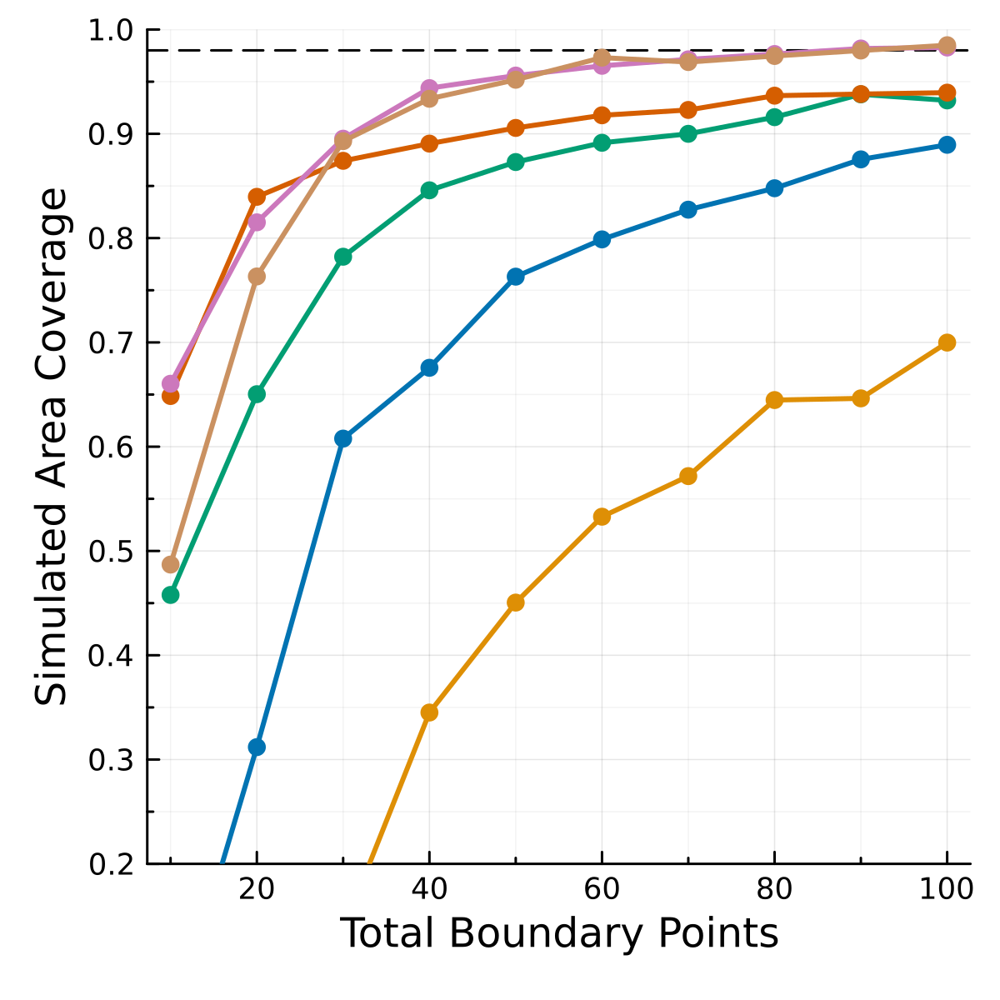

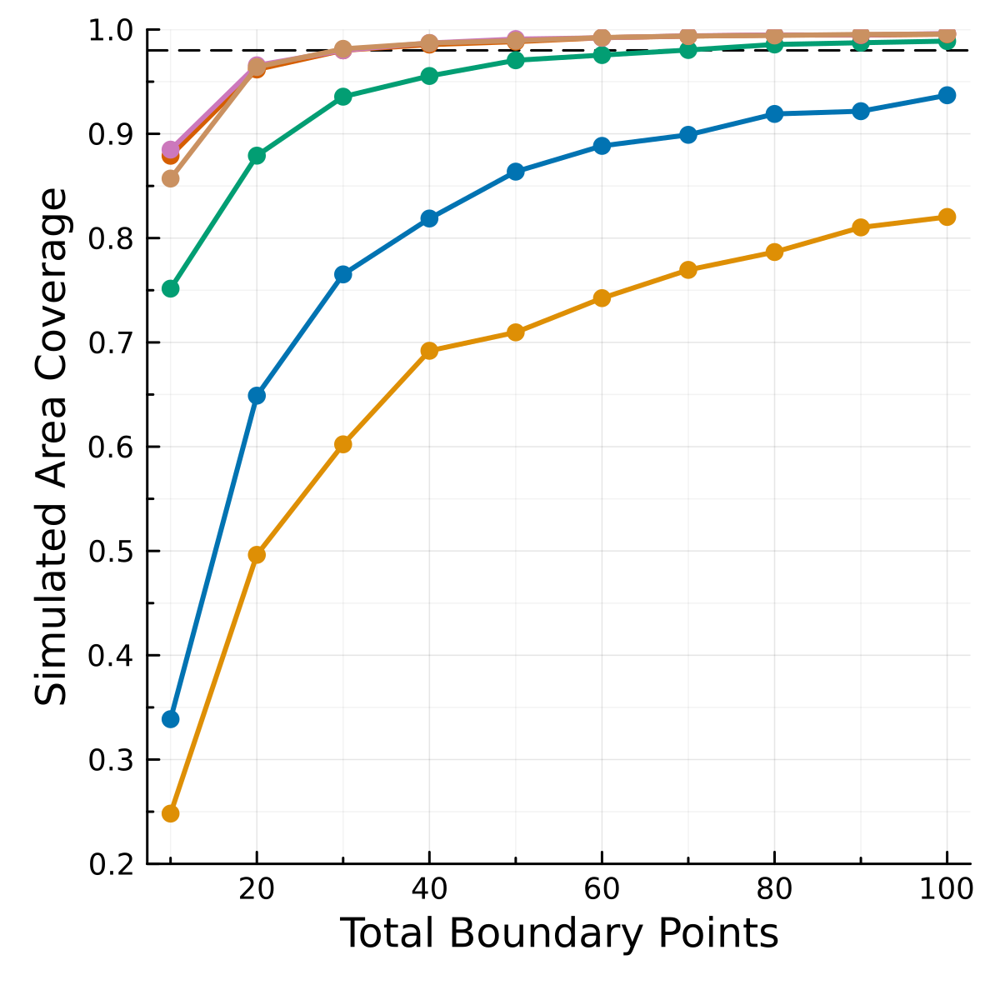

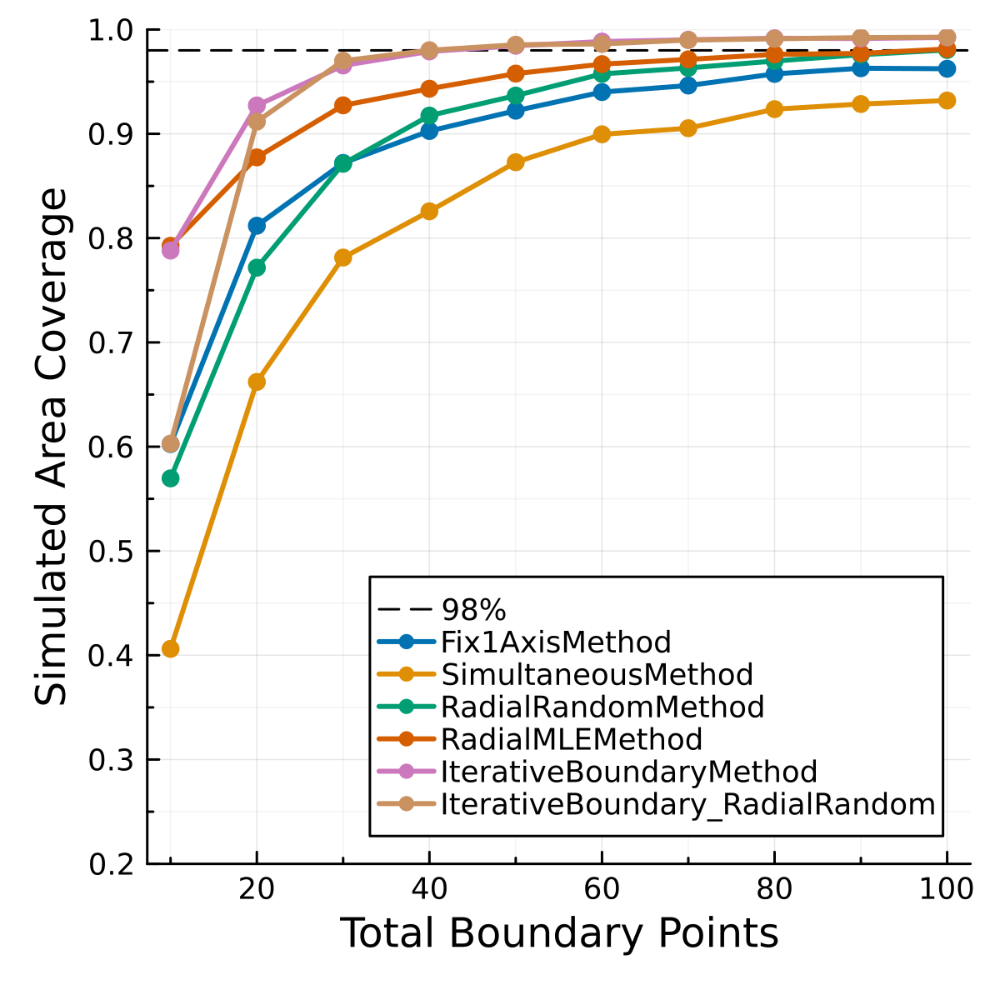

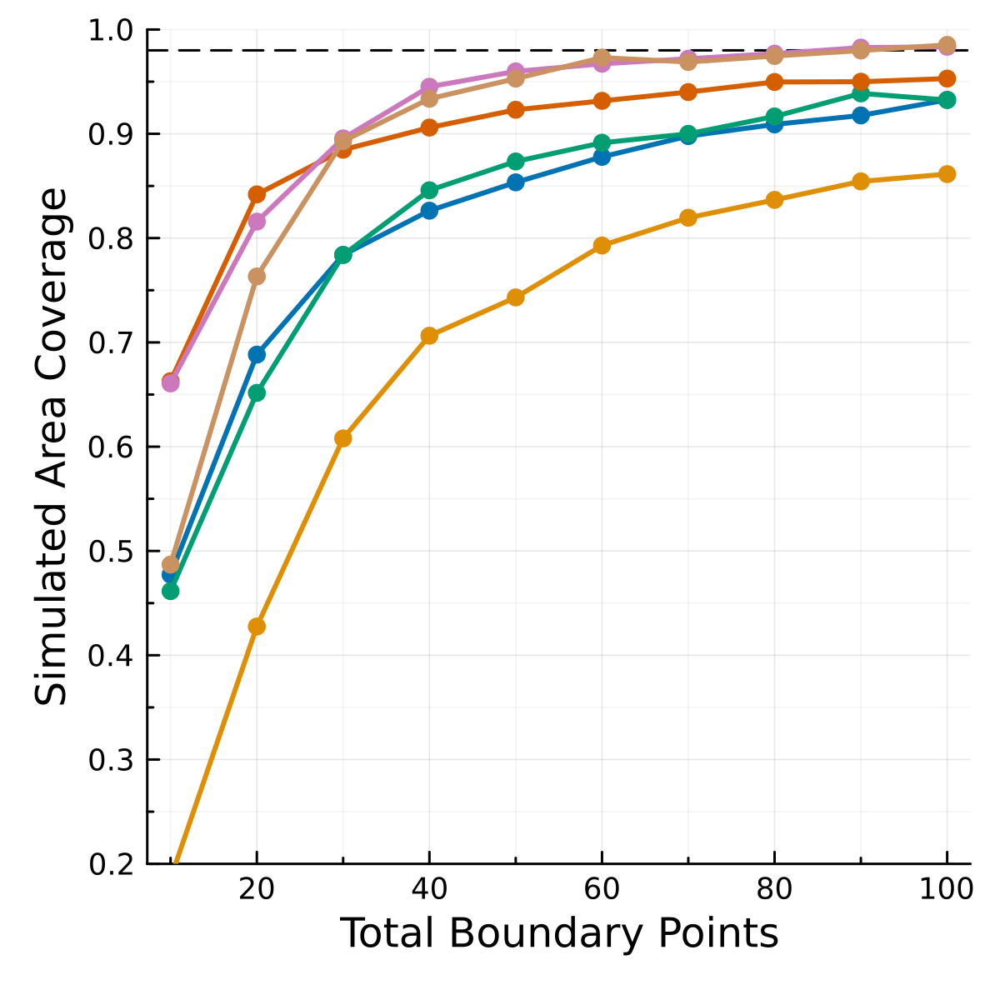

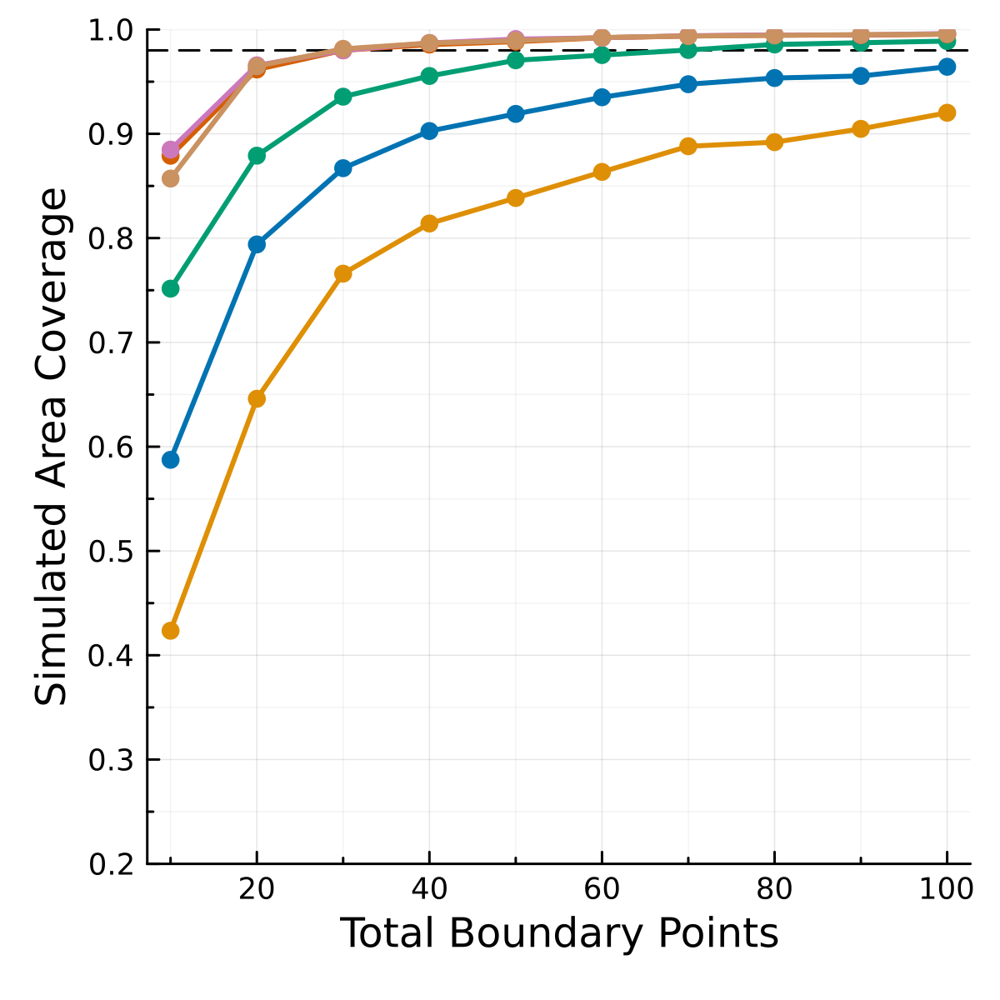

In [3]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Boundary Points", minorgrid=true, minorticks=2, yticks=0.1:0.1:1.0, ylims=(0.2, 1.0));
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
data_df = CSV.read(joinpath(output_location, "bivariate_boundary_coverage.csv"), DataFrame);

method_df = CSV.read(joinpath(output_location, "methods.csv"), DataFrame);
method_df[:, :method_name] .= [split(name, "(")[1] for name in method_df.method_name];
method_df[end, :method_name] = "IterativeBoundary_RadialRandom"
data_df[:, :hullmethod] .= [split(name, "(")[1] for name in data_df.hullmethod];

data_df = leftjoin(data_df, method_df, on=:method_key);

data_df.method_name = categorical(data_df.method_name, levels=["Fix1AxisMethod", "SimultaneousMethod", "RadialRandomMethod", "RadialMLEMethod", "IterativeBoundaryMethod", "IterativeBoundary_RadialRandom"])

plots = []
for sub_df in groupby(data_df, [:hullmethod, :θindices])
    plt = @df sub_df plot(:num_points, :coverage_median; group=:method_name, marker=(:circle), ylabel="Simulated Area Coverage (0.50 Quantile)", format...)
    hline!(plt, [0.98], linestyle=:dash, label="98%", color=:black)
    plt.subplots[1].series_list = [plt.subplots[1].series_list[end]; plt.subplots[1].series_list[1:end-1]]
    push!(plots, plt)
end

# display(plots[1])
# display(plots[2])
# display(plots[3])
# display(plots[4])
# display(plots[5])
# display(plots[6])

plots = []
for sub_df in groupby(data_df, [:hullmethod, :θindices])
    plt = @df sub_df plot(:num_points, :coverage_lb; group=:method_name, marker=(:circle), ylabel="Simulated Area Coverage", format...)
    hline!(plt, [0.98], linestyle=:dash, label="98%", color=:black)
    plt.subplots[1].series_list = [plt.subplots[1].series_list[end]; plt.subplots[1].series_list[1:end-1]]
    push!(plots, plt)
end

for i in eachindex(plots)
    plot!(plots[i], size=(400, 400))
    if (((i - 1) % 3) + 1) != 1
        plot!(plots[i], legend_position=nothing)
    end

    hullmethod = i < 4 ? "_MPP_" : "_ConvexHull_"

    savefig(plots[i], joinpath(output_location, "bivariate_area_coverage" * hullmethod * string(((i - 1) % 3) + 1) * ".pdf"))
end

display(plots[1])
display(plots[2])
display(plots[3])
display(plots[4])
display(plots[5])
display(plots[6])





format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=100, title="", legend_position=:bottomright,
    # xlabel="Total Boundary Points", minorgrid=true, minorticks=2, 
    yticks=00:10:100
);


pnts_to_reach_coverage_df = DataFrame(method_name=String[], hullmethod=String[], θindices=String[], quantile=Float64[], coverage_level=String[], num_points=Int[])
coverage_levels = [0.97, 0.98, 0.99]

for sub_df in groupby(data_df, [:method_name, :hullmethod, :θindices])

    for level in coverage_levels
        i = findfirst(sub_df.coverage_median .>= level)
        dfrow = [sub_df.method_name[1], sub_df.hullmethod[1], sub_df.θindices[1], 0.5, string(level), -10]
        if isnothing(i)
            push!(pnts_to_reach_coverage_df, dfrow)
        else
            dfrow[end] = sub_df[i, :num_points]
            push!(pnts_to_reach_coverage_df, dfrow)
        end
    end

end

for sub_df in groupby(data_df, [:method_name, :hullmethod, :θindices])

    for level in coverage_levels
        i = findfirst(sub_df.coverage_lb .>= level)
        dfrow = [sub_df.method_name[1], sub_df.hullmethod[1], sub_df.θindices[1], 0.05, string(level), -10]
        if isnothing(i)
            push!(pnts_to_reach_coverage_df, dfrow)
        else
            dfrow[end] = sub_df[i, :num_points]
            push!(pnts_to_reach_coverage_df, dfrow)
        end
    end

end

pnts_to_reach_coverage_df.coverage_level = categorical(pnts_to_reach_coverage_df.coverage_level, levels=string.(coverage_levels))
pnts_to_reach_coverage_df.method_name = categorical(pnts_to_reach_coverage_df.method_name, levels=["Fix1AxisMethod", "SimultaneousMethod", "RadialRandomMethod", "RadialMLEMethod", "IterativeBoundaryMethod", "IterativeBoundary_RadialRandom"])


pnts_to_reach_wide = unstack(pnts_to_reach_coverage_df, [:θindices, :method_name, :hullmethod, :quantile], :coverage_level, :num_points)
sort!(pnts_to_reach_wide, [:quantile, :θindices, :method_name])

CSV.write(joinpath(output_location, "pnts_to_reach_coverage.csv"), pnts_to_reach_wide);


#### Performance of boundary methods

In [8]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays
using StatsBase

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:topleft, xlabel="Total Boundary Points", minorgrid=true, minorticks=2, #yticks=0.1:0.1:1.0
    opacity=0.8,
);
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
data_df = CSV.read(joinpath(output_location, "confidence_boundary_ll_calls.csv"), DataFrame);

method_df = CSV.read(joinpath(output_location, "methods.csv"), DataFrame);
method_df[:, :method_name] .= [split(name, "(")[1] for name in method_df.method_name];
method_df[end, :method_name] = "IterativeBoundary_RadialRandom"

data_df = leftjoin(data_df, method_df, on=:method_key);

data_df.method_name = categorical(data_df.method_name, levels=["Fix1AxisMethod", "SimultaneousMethod", "RadialRandomMethod", "RadialMLEMethod", "IterativeBoundaryMethod", "IterativeBoundary_RadialRandom"]);


data_gdf = groupby(data_df, [:method_name, :num_points])
data_mean_opt = combine(data_gdf, :optimisation_calls => mean, :likelihood_calls => mean)

data_mean_opt.method_name = categorical(data_mean_opt.method_name, levels=["Fix1AxisMethod", "SimultaneousMethod", "RadialRandomMethod", "RadialMLEMethod", "IterativeBoundaryMethod", "IterativeBoundary_RadialRandom"]);

plt = @df data_mean_opt plot(:num_points, :optimisation_calls_mean; marker=(:circle), group=:method_name, ylims=(0, 3000), ylabel="Mean Optimisation Calls", format...)
savefig(plt, joinpath(output_location, "boundary_points_vs_opt_calls_mean.pdf"))

plt = @df data_mean_opt plot(:num_points, :likelihood_calls_mean; marker=(:circle), group=:method_name, ylabel="Mean Likelihood Calls", format...)
savefig(plt, joinpath(output_location, "boundary_points_vs_ll_calls_mean.pdf"))

plots = []
for sub_df in groupby(data_df, [:θindices])
    plt = plot()

    @df sub_df plot!(plt, :num_points, :optimisation_calls; marker=(:circle), group=:method_name, ylims=(0, 3000), ylabel="Optimisation Calls", format...)
    push!(plots, plt)
end

for i in eachindex(plots)
    plot!(plots[i], size=(400, 400))
    if i != 1
        plot!(plots[i], legend_position=nothing)
    end

    savefig(plots[i], joinpath(output_location, "boundary_points_vs_opt_calls_" * string(i) * ".pdf"))
end

Impact of 50% wider bounds

In [17]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays
using StatsBase

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=nothing, xlabel="Total Boundary Points", minorgrid=true, minorticks=2, #yticks=0.1:0.1:1.0
    opacity=0.8,
);
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
data_df = CSV.read(joinpath(output_location, "confidence_boundary_ll_calls_widerbounds.csv"), DataFrame);

method_df = CSV.read(joinpath(output_location, "methods.csv"), DataFrame);
method_df[:, :method_name] .= [split(name, "(")[1] for name in method_df.method_name];
method_df[end, :method_name] = "IterativeBoundary_RadialRandom"

data_df = leftjoin(data_df, method_df, on=:method_key);

data_df.method_name = categorical(data_df.method_name, levels=["Fix1AxisMethod", "SimultaneousMethod", "RadialRandomMethod", "RadialMLEMethod", "IterativeBoundaryMethod", "IterativeBoundary_RadialRandom"]);


data_gdf = groupby(data_df, [:method_name, :num_points])
data_mean_opt = combine(data_gdf, :optimisation_calls => mean, :likelihood_calls => mean)

data_mean_opt.method_name = categorical(data_mean_opt.method_name, levels=["Fix1AxisMethod", "SimultaneousMethod", "RadialRandomMethod", "RadialMLEMethod", "IterativeBoundaryMethod", "IterativeBoundary_RadialRandom"]);

plt = @df data_mean_opt plot(:num_points, :optimisation_calls_mean; marker=(:circle), group=:method_name, ylims=(0, 3000), ylabel="Mean Optimisation Calls", format...)
savefig(plt, joinpath(output_location, "boundary_points_vs_opt_calls_widerbounds_mean.pdf"))

plt = @df data_mean_opt plot(:num_points, :likelihood_calls_mean; marker=(:circle), group=:method_name, ylabel="Mean Likelihood Calls", format...)
savefig(plt, joinpath(output_location, "boundary_points_vs_ll_calls_widerbounds_mean.pdf"))

plots = []
for sub_df in groupby(data_df, [:θindices])
    plt = plot()

    @df sub_df plot!(plt, :num_points, :optimisation_calls; marker=(:circle), group=:method_name, ylims=(0, 3000), ylabel="Optimisation Calls", format...)
    push!(plots, plt)
end

for i in eachindex(plots)
    plot!(plots[i], size=(400, 400))
    if i == 3
        plot!(plots[i], legend_position=:topleft)
    end

    savefig(plots[i], joinpath(output_location, "boundary_points_vs_opt_calls_widerbounds_" * string(i) * ".pdf"))
end

#### Performance of iterative boundary method vs dimensional sampling

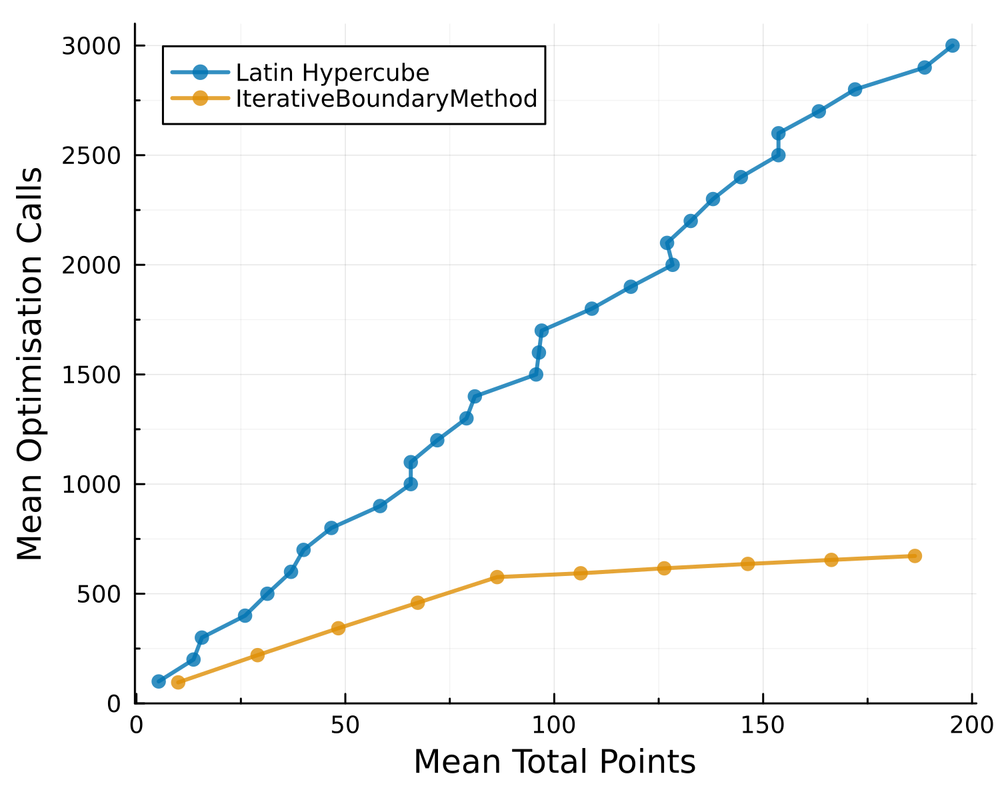

In [23]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays
using StatsBase

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:topleft, minorgrid=true, minorticks=2, 
    opacity=0.8,
);
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
data_df = CSV.read(joinpath(output_location, "bivariate_confidence_set_opt_calls_vs_points.csv"), DataFrame);

data_df[:, :method] .= [split(name, "(")[1] for name in data_df.method];

data_df.method = categorical(data_df.method, levels=["Latin Hypercube", "IterativeBoundaryMethod"]);

data_gdf = groupby(data_df, [:method, :iter])
data_mean_opt = combine(data_gdf, :num_points=>mean, :optimisation_calls => mean, :likelihood_calls => mean)

data_mean_opt.method = categorical(data_mean_opt.method, levels=["Latin Hypercube", "IterativeBoundaryMethod"]);

plt = @df data_mean_opt plot(:num_points_mean, :optimisation_calls_mean; marker=(:circle), group=:method, ylims=(0, 3100), yticks=0.:500:3000, ylabel="Mean Optimisation Calls", xlabel="Mean Total Points", format...)
savefig(plt, joinpath(output_location, "bivariate_points_vs_opt_calls_mean.pdf"))

display(plt)

plt = @df data_mean_opt plot(:likelihood_calls_mean, :num_points_mean; marker=(:circle), group=:method, xlabel="Mean Likelihood Calls", ylabel="Mean Total Points", format...)
savefig(plt, joinpath(output_location, "bivariate_points_vs_ll_calls_mean.pdf"))

plots = []
for sub_df in groupby(data_df, [:θindices])
    plt = plot()

    @df sub_df plot!(plt, :num_points, :optimisation_calls; marker=(:circle), group=:method, ylims=(0, 3000), ylabel="Optimisation Calls", format...)
    push!(plots, plt)
end

for i in eachindex(plots)
    plot!(plots[i], size=(400, 400))
    if i != 1
        plot!(plots[i], legend_position=nothing)
    end

    savefig(plots[i], joinpath(output_location, "bivariate_points_vs_opt_calls_" * string(i) * ".pdf"))
end

##### Impact of 50% narrower bounds

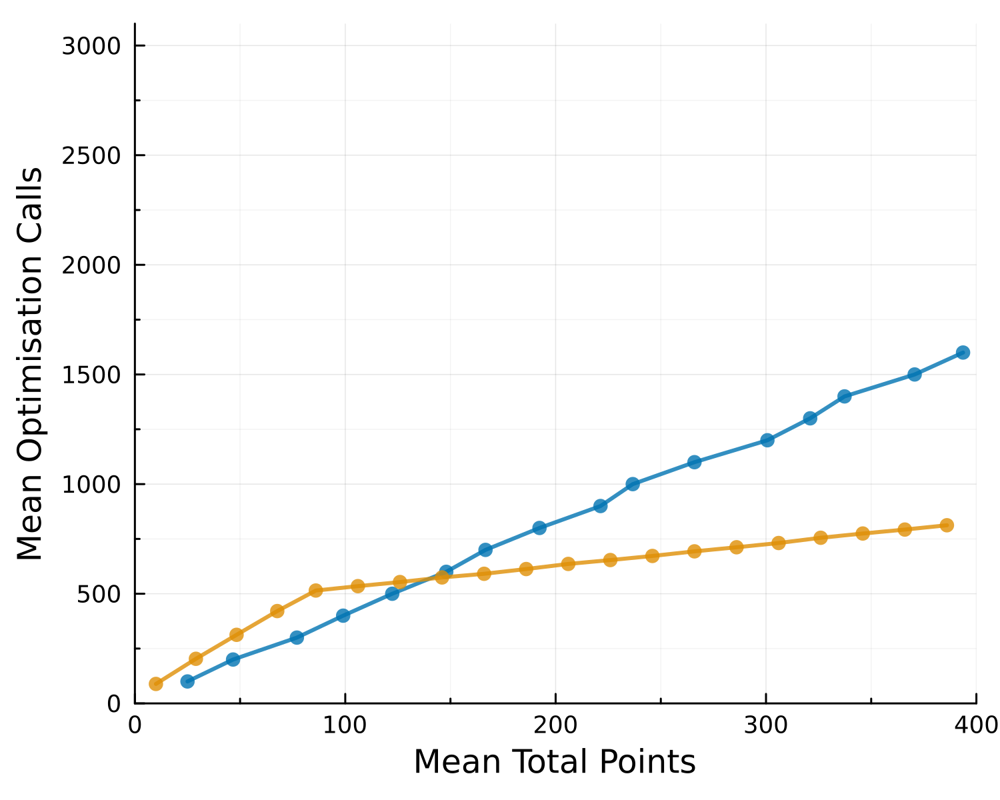

In [1]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays
using StatsBase

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=nothing, minorgrid=true, minorticks=2,
    opacity=0.8,
);
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
data_df = CSV.read(joinpath(output_location, "bivariate_confidence_set_opt_calls_vs_points_narrowerbounds.csv"), DataFrame);

data_df[:, :method] .= [split(name, "(")[1] for name in data_df.method];

data_df.method = categorical(data_df.method, levels=["Latin Hypercube", "IterativeBoundaryMethod"]);

data_gdf = groupby(data_df, [:method, :iter])
data_mean_opt = combine(data_gdf, :num_points => mean, :optimisation_calls => mean, :likelihood_calls => mean)

data_mean_opt.method = categorical(data_mean_opt.method, levels=["Latin Hypercube", "IterativeBoundaryMethod"]);

data_mean_opt = filter(row -> row.num_points_mean < 400, data_mean_opt);

plt = @df data_mean_opt plot(:num_points_mean, :optimisation_calls_mean; marker=(:circle), group=:method, xlims=(0,400), ylims=(0, 3100), yticks=0.0:500:3000, ylabel="Mean Optimisation Calls", xlabel="Mean Total Points", format...)
savefig(plt, joinpath(output_location, "bivariate_points_vs_opt_calls_mean_narrowerbounds.pdf"))

display(plt)

plt = @df data_mean_opt plot(:likelihood_calls_mean, :num_points_mean; marker=(:circle), group=:method, xlabel="Mean Likelihood Calls", ylabel="Mean Total Points", format...)
savefig(plt, joinpath(output_location, "bivariate_points_vs_ll_calls_mean_narrowerbounds.pdf"))

plots = []
for sub_df in groupby(data_df, [:θindices])
    plt = plot()

    @df sub_df plot!(plt, :num_points, :optimisation_calls; marker=(:circle), group=:method, ylims=(0, 3000), ylabel="Optimisation Calls", format...)
    push!(plots, plt)
end

for i in eachindex(plots)
    plot!(plots[i], size=(400, 400))
    if i != 1
        plot!(plots[i], legend_position=nothing)
    end

    savefig(plots[i], joinpath(output_location, "bivariate_points_vs_opt_calls_narrowerbounds_" * string(i) * ".pdf"))
end

### Lotka-volterra example

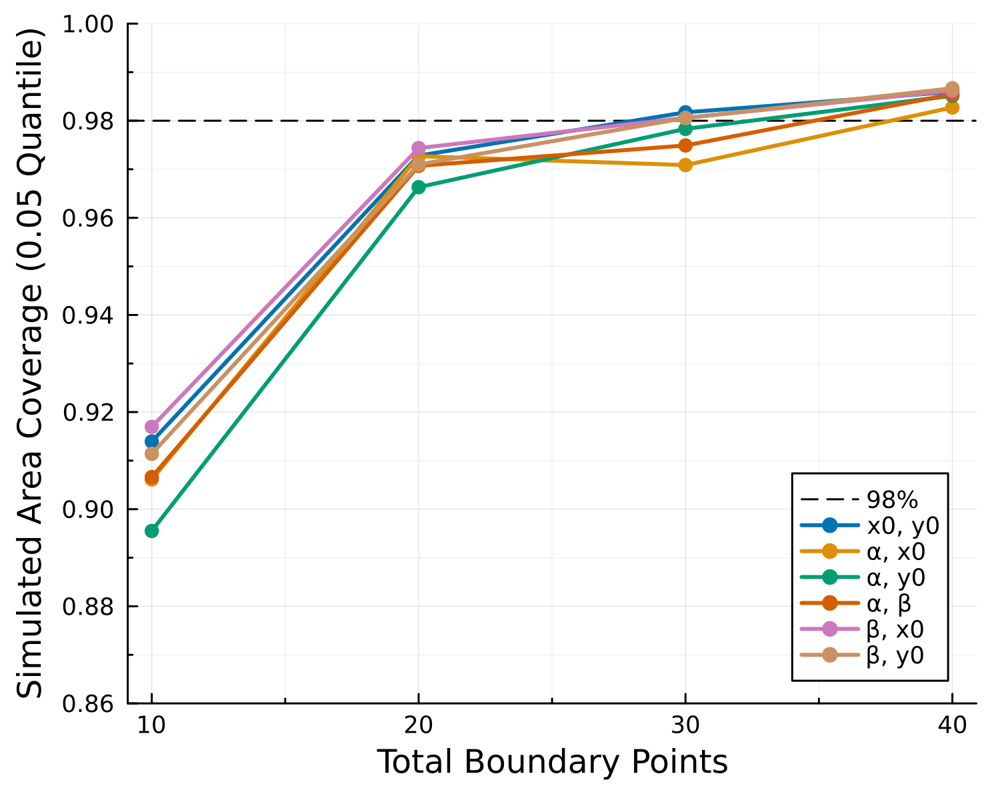

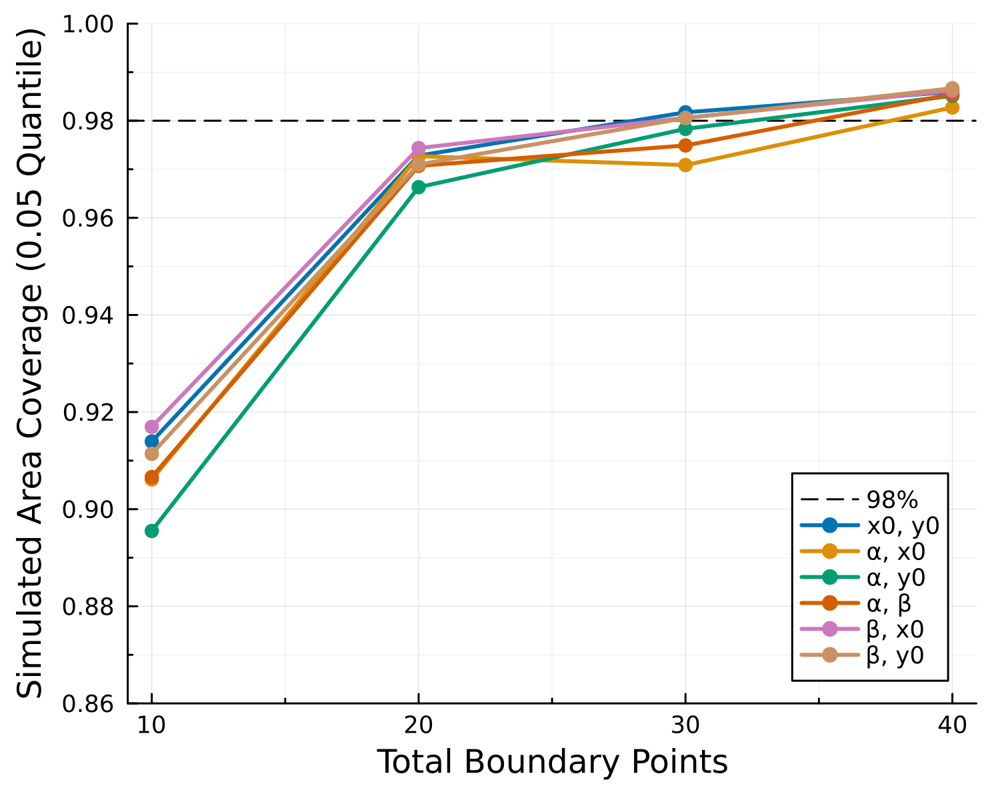

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\lotka_volterra\\bivariate_area_coverage_ConvexHull.pdf"

In [4]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Boundary Points", minorgrid=true, minorticks=2, yticks=0.86:0.02:1.0, ylims=(0.86, 1.0));
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[2];
output_location = joinpath("Outputs", loc);
data_df = CSV.read(joinpath(output_location, "bivariate_boundary_coverage.csv"), DataFrame);

data_df[:, :hullmethod] .= [split(name, "(")[1] for name in data_df.hullmethod];

# θnames=["α", "β", "x0", "y0"]
# data_df.θnames2 = ["("*θnames[inds[1]] *", "*  θnames[inds[2]]*")" for inds in data_df.θindices)

data_df.θnames = [replace(strip(name, ['[', ']']), ':' => "") for name in data_df.θnames]
# data_df.θindices = categorical(data_df.θindices, levels=unique(data_df.θindices));


plots = []
for sub_df in groupby(data_df, [:hullmethod])
    plt = @df sub_df plot(:num_points, :coverage_lb; group=:θnames, marker=(:circle), ylabel="Simulated Area Coverage (0.05 Quantile)", format...)
    hline!(plt, [0.98], linestyle=:dash, label="98%", color=:black)
    plt.subplots[1].series_list = [plt.subplots[1].series_list[end]; plt.subplots[1].series_list[1:end-1]]
    push!(plots, plt)
end

display(plots[1])
display(plots[2])

savefig(plots[1], joinpath(output_location, "bivariate_area_coverage_MPP.pdf"))
savefig(plots[1], joinpath(output_location, "bivariate_area_coverage_ConvexHull.pdf"))


### Two-species Logistic example

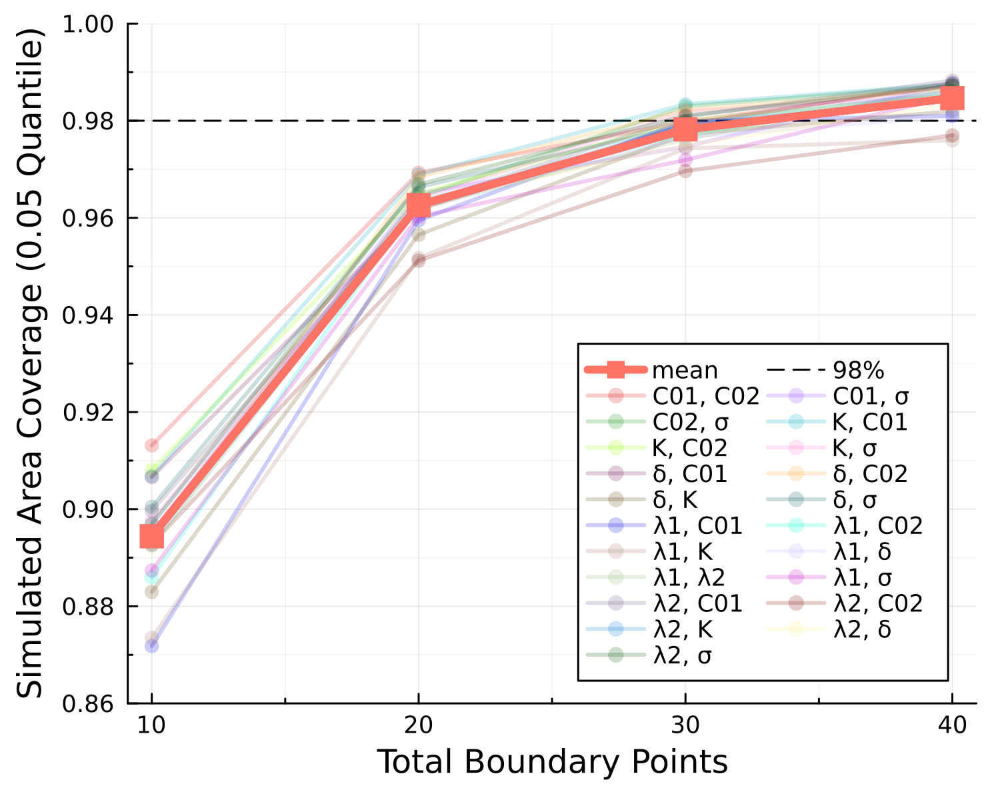

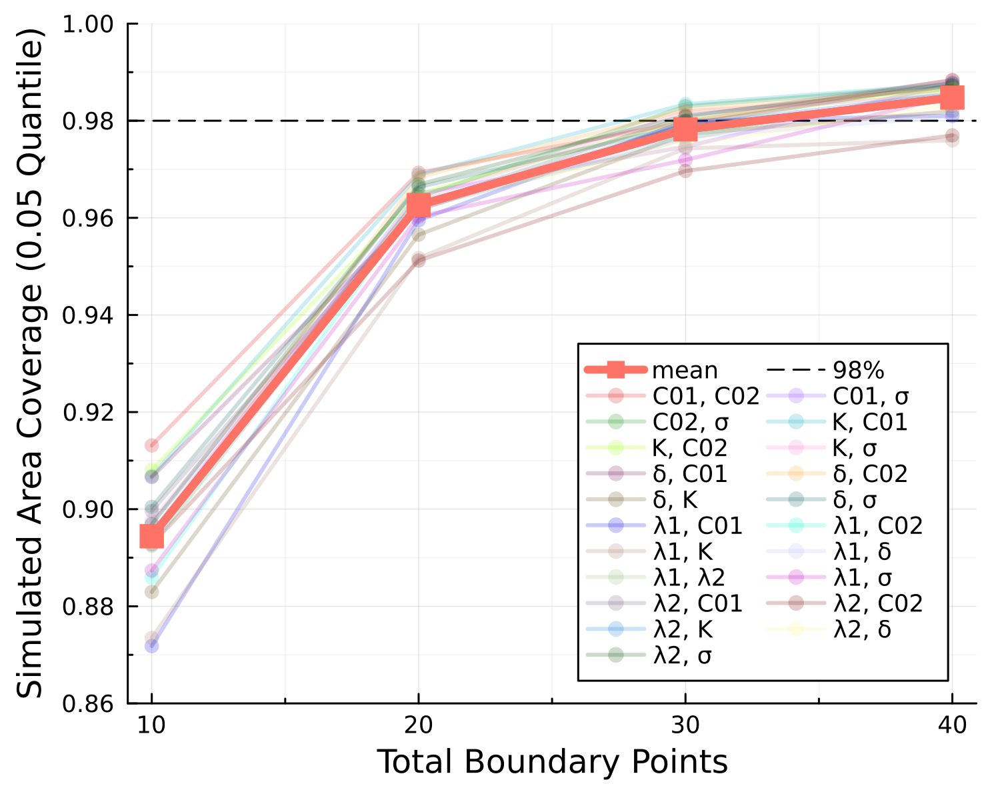

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\logistic_twospecies_logitnormal\\bivariate_area_coverage_ConvexHull.pdf"

In [3]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays
using StatsBase

format = (palette=:glasbey_bw_minc_20_n256, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Boundary Points", minorgrid=true, xticks=10:10:40, minorticks=2, yticks=0.86:0.02:1.0, ylims=(0.86, 1.0), legend_columns=2);
locs = ["logistic", "lotka_volterra", "logistic_twospecies", "logistic_twospecies_logitnormal"];

loc = locs[4];
output_location = joinpath("Outputs", loc);
data_df = CSV.read(joinpath(output_location, "bivariate_boundary_coverage.csv"), DataFrame);

data_df[:, :hullmethod] .= [split(name, "(")[1] for name in data_df.hullmethod];

# θnames=["α", "β", "x0", "y0"]
# data_df.θnames2 = ["("*θnames[inds[1]] *", "*  θnames[inds[2]]*")" for inds in data_df.θindices)

data_df.θnames = [replace(strip(name, ['[', ']']), ':' => "") for name in data_df.θnames]
# data_df.θindices = categorical(data_df.θindices, levels=unique(data_df.θindices));

plots = []
for sub_df in groupby(data_df, [:hullmethod])
    plt = @df sub_df plot(:num_points, :coverage_lb; group=:θnames, marker=(:circle), opacity=0.2, ylabel="Simulated Area Coverage (0.05 Quantile)", format...)

    sub_gdf = groupby(sub_df, [:num_points])
    sub_gdf_mean = combine(sub_gdf, :coverage_lb => mean)
    @df sub_gdf_mean plot!(:num_points, :coverage_lb_mean; marker=(:square, 6), color=23, opacity=1.0, label="", msw=0, lw=4)
    @df sub_gdf_mean plot!(:num_points, :coverage_lb_mean; marker=(:square, 6), color=23, opacity=1.0, label="mean", msw=0, lw=4)

    hline!(plt, [0.98], linestyle=:dash, label="98%", color=:black)
    plt.subplots[1].series_list = [plt.subplots[1].series_list[end-1:end]; plt.subplots[1].series_list[1:end-2]]
    push!(plots, plt)
end

display(plots[1])
display(plots[2])

savefig(plots[1], joinpath(output_location, "bivariate_area_coverage_MPP.pdf"))
savefig(plots[1], joinpath(output_location, "bivariate_area_coverage_ConvexHull.pdf"))


## Bivariate Confidence Profiles

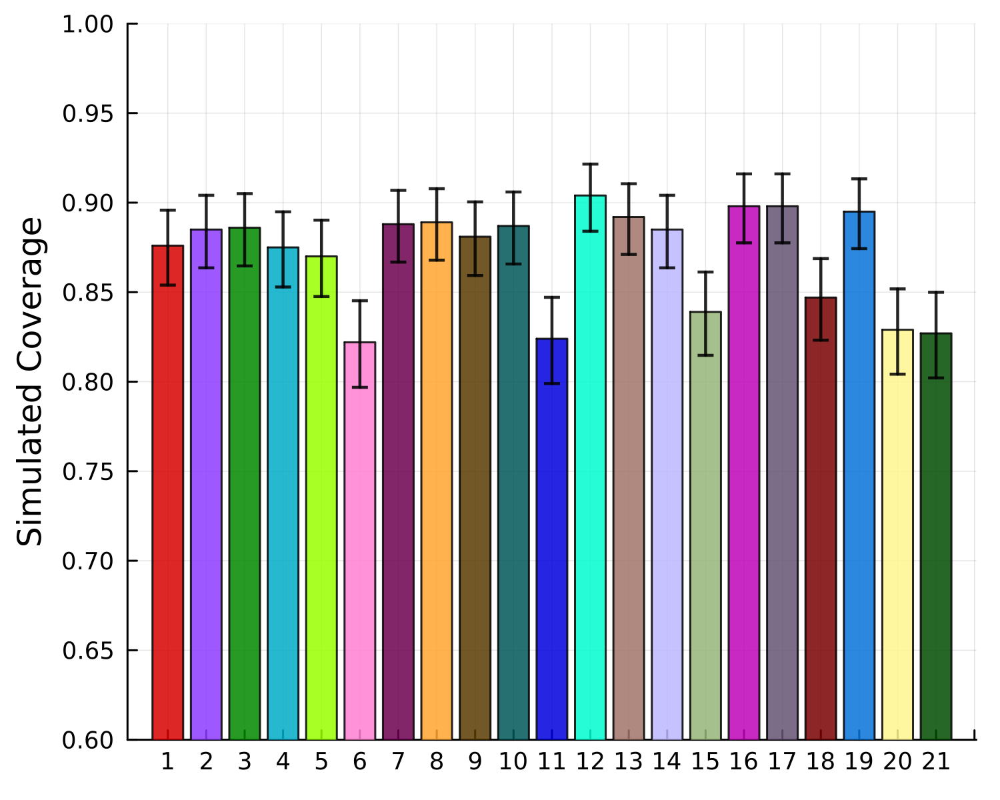

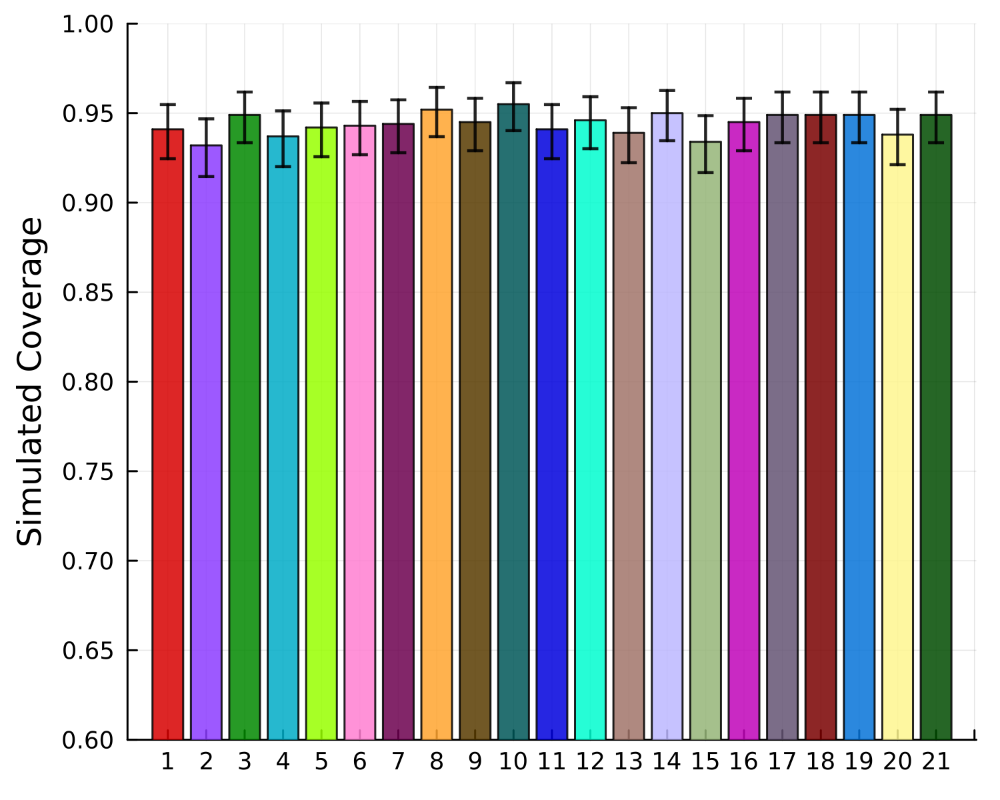

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\logistic_twospecies_logitnormal\\bivariate_parameter_coverage_logistic_twospecies_logitnormal_significantly_more_data.pdf"

In [4]:
using DataFrames, CSV
using Plots, StatsPlots;
gr();
using LaTeXStrings
using CategoricalArrays

format = (msw=1.5, size=(500, 400), dpi=300, title="", legend_position=nothing, ylabel="Simulated Coverage");
locs = ["logistic", "lotka_volterra", "logistic_twospecies", "logistic_twospecies_logitnormal"]

loc = locs[1]
output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "bivariate_parameter_coverage.csv"), DataFrame);
# data_df.θname = categorical(data_df.θname, levels=data_df.θname)
data_df.θnames = [replace(strip(name, ['[', ']']), ':' => "") for name in data_df.θnames]

plt = @df data_df plot(:θnames, :coverage; st=:bar, color=palette(:Paired)[1:nrow(data_df)], ylimits=(0.8, 1.0), yticks=LinRange(0.8, 1.0, 5),
    yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);
annotate!(data_df.θnames, fill(0.8, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))));

# display(plt)
savefig(plt, joinpath(output_location, "bivariate_parameter_coverage_" * loc * ".pdf"))

loc = locs[2]
output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "bivariate_parameter_coverage.csv"), DataFrame);
# data_df.θname = categorical(data_df.θname, levels=data_df.θname)

data_df.θnames = [replace(strip(name, ['[', ']']), ':'=>"") for name in data_df.θnames]

plt = @df data_df plot(:θnames, :coverage; st=:bar, palette=(:Paired), color=collect(1:nrow(data_df)), bar_position=:stack, ylimits=(0.8, 1.0), yticks=LinRange(0.8, 1.0, 5),
    yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);
annotate!(data_df.θnames, fill(0.8, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))

# display(plt)
savefig(plt, joinpath(output_location, "bivariate_parameter_coverage_" * loc * ".pdf"))

loc = locs[4]
output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "bivariate_parameter_coverage.csv"), DataFrame);
data_df.θnames = [replace(strip(name, ['[', ']']), ':' => "") for name in data_df.θnames]
data_df.combo .= categorical(string.(collect(1:21)), levels=string.(collect(1:21)))

plt = @df data_df plot(:combo, :coverage; st=:bar, group=:combo, palette=:glasbey_bw_minc_20_n256, opacity=0.85, bar_position=:stack, ylimits=(0.6, 1.0), yticks=LinRange(0.6, 1.0, 9),
                        yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);

# annotate!(data_df.combo, fill(0.6, nrow(data_df)), text.(data_df.coverage, fill(:bottom, nrow(data_df)), fill(:black, nrow(data_df)), fill(8, nrow(data_df))))
savefig(plt, joinpath(output_location, "bivariate_parameter_coverage_" * loc * ".pdf"))
display(plt)

output_location = joinpath("Outputs", loc)
data_df = CSV.read(joinpath(output_location, "bivariate_parameter_coverage_significantly_more_data.csv"), DataFrame);
data_df.θnames = [replace(strip(name, ['[', ']']), ':' => "") for name in data_df.θnames]
data_df.combo .= categorical(string.(collect(1:21)), levels=string.(collect(1:21)))

plt = @df data_df plot(:combo, :coverage; st=:bar, group=:combo, palette=:glasbey_bw_minc_20_n256, opacity=0.85, bar_position=:stack, ylimits=(0.6, 1.0), yticks=LinRange(0.6, 1.0, 9),
                        yerror=(data_df.coverage .- data_df.coverage_lb, data_df.coverage_ub .- data_df.coverage), format...);

# annotate!(data_df.θnames, fill(0.6,nrow(data_df)), text.(data_df.coverage, fill(:bottom,nrow(data_df)), fill(:black,nrow(data_df)), fill(8,nrow(data_df))))

display(plt)
savefig(plt, joinpath(output_location, "bivariate_parameter_coverage_"*loc*"_significantly_more_data.pdf"))

## Predictions of Model Solution (Data Distribution Mean)


In [9]:
# common functions for the below
function get_data_df(file_name::String, output_location::String, uses_all_profiles::Bool=true)
    data_df = DataFrame(Arrow.Table(joinpath(output_location, file_name)), copycols=true)

    data_df_single_profiles = filter(:n_random_combinations => ==(0), data_df)
    if data_df_single_profiles.θname[1] isa AbstractVector
        data_df_single_profiles.name = [replace(strip(string(name), ['[', ']']), ':' => "") for name in data_df_single_profiles.θname]
    else
        data_df_single_profiles.name .= string.(data_df_single_profiles.θname)
    end

    data_df_unions = filter(:n_random_combinations => >(0), data_df)
    data_df_unions.name .= string.(data_df_unions.n_random_combinations) .* ifelse.(data_df_unions.n_random_combinations .== 1, " random profile", " random profiles")

    if uses_all_profiles
        data_df_unions.name .= ifelse.(data_df_unions.n_random_combinations .== maximum(data_df_unions.n_random_combinations), "All profiles", data_df_unions.name)
    end

    data_df = vcat(data_df_single_profiles, data_df_unions)
    data_df.name = categorical(copy(data_df.name), levels=unique(data_df.name))
    return data_df
end

function plot_simultaneous_coverage(data_df; palette=:seaborn_colorblind, legend_position=:bottomright, xlabel="Total Points Sampled", ylims=(0.0, 1.0), kwargs...)

    format = (palette=palette, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=legend_position, xlabel=xlabel,
        minorgrid=true, minorticks=2, yticks=0.1:0.1:1.0, ylims=ylims, kwargs...)

    plt = plot()
    @df data_df plot!(plt, :num_points, :simultaneous_coverage; group=:name,
        yerror=(:simultaneous_coverage .- :coverage_lb, :coverage_ub .- :simultaneous_coverage),
        marker=(:circle), ylabel="Simulated Simultaneous Coverage", format...)
    hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
    plt.subplots[1].series_list = [plt.subplots[1].series_list[end]; plt.subplots[1].series_list[1:end-1]]
    display(plt)

    return plt
end

function plot_pointwise_coverage(data_df, t_pred, two_outputs::Bool=false; palette=:seaborn_colorblind, legend_position=:bottomright, xlabel="Total Points Sampled", ylims=(0.0, 1.0), kwargs...)

    format = (palette=palette, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=legend_position, xlabel=xlabel,
        minorgrid=true, minorticks=2, yticks=0.1:0.1:1.0, ylims=ylims, kwargs...)

    if two_outputs
        plt1 = plot(; xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, format...)
        for df in groupby(data_df, :name)
            @df df plot!(plt1, t_pred, :pointwise_coverage[1][1:length(t_pred)]; lw=2, label=:name[1], xlabel="t",
                ylabel="Simulated Pointwise Coverage")
        end
        display(plt1)

        plt2 = plot(; xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, format...)
        for df in groupby(data_df, :name)
            @df df plot!(plt2, t_pred, :pointwise_coverage[1][length(t_pred)+1:end]; lw=2, label=:name[1], xlabel="t",
                ylabel="Simulated Pointwise Coverage")
        end
        display(plt2)

        return plt1, plt2
    end

    plt = plot(; xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, format...)
    for df in groupby(data_df, :name)
        @df df plot!(plt, t_pred, :pointwise_coverage; lw=2, label=:name[1], xlabel="t",
            ylabel="Simulated Pointwise Coverage")
    end
    display(plt)

    return plt
end


plot_pointwise_coverage (generic function with 2 methods)

### Logistic

#### Full Sampling

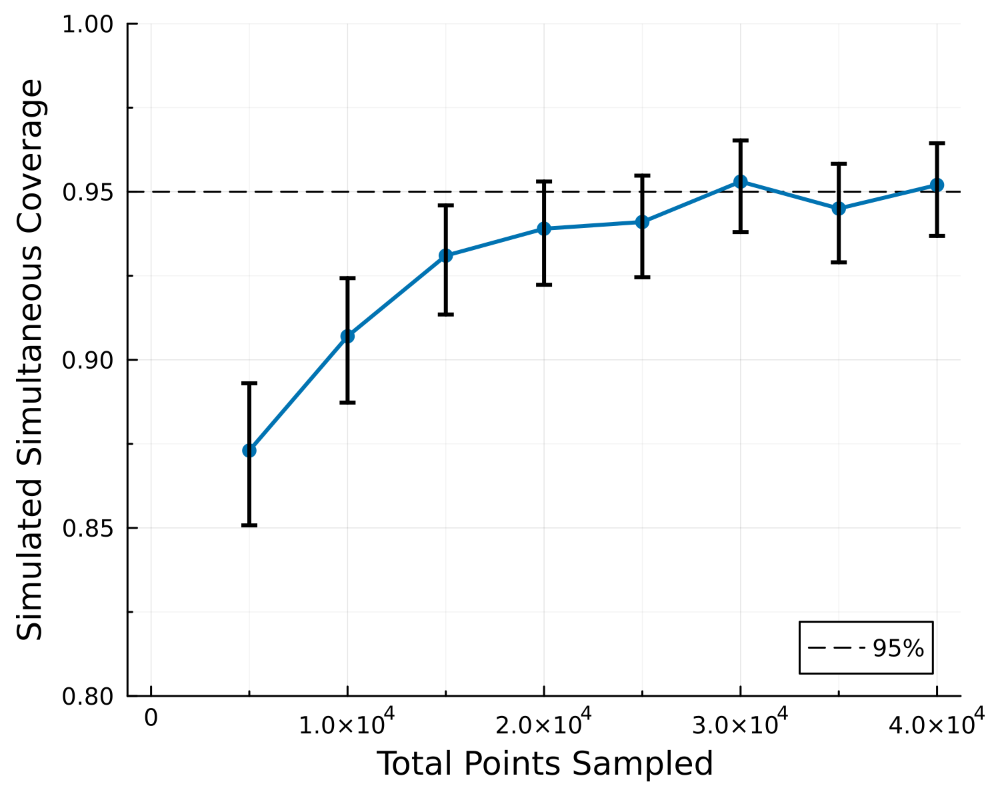

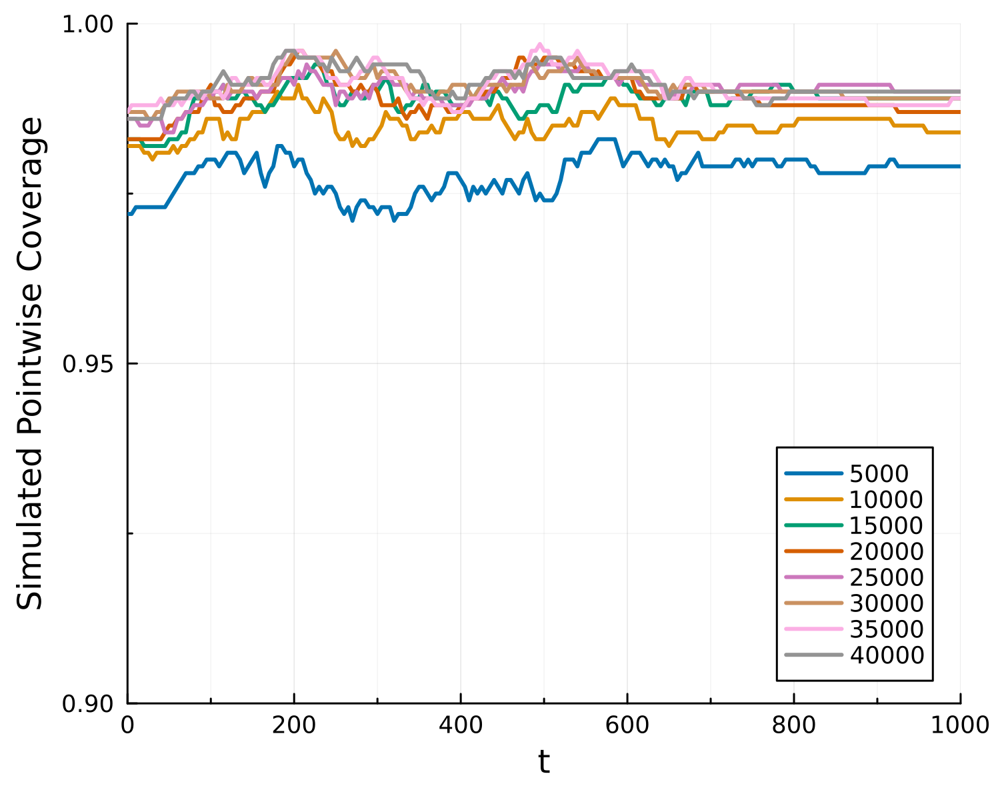

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\logistic\\pointwise_prediction_coverage_logistic.pdf"

In [4]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = 0:5:1000

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Points Sampled", minorgrid=true, minorticks=2, yticks=0.1:0.05:1.0, ylims=(0.8, 1.0));
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
# data_df = CSV.read(joinpath(output_location, "full_sampling_prediction_coverage.csv"), DataFrame);
data_df = DataFrame(Arrow.Table(joinpath(output_location, "full_sampling_prediction_coverage.arrow")), copycols=true);

data_df = filter(:n_random_combinations => ==(0), data_df)

plt = plot()
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
@df data_df plot!(:num_points, :simultaneous_coverage; color=1, 
    yerror=(:simultaneous_coverage .- :coverage_lb, :coverage_ub .- :simultaneous_coverage),
    rightmargin=3mm,
    marker=(:circle), label="", ylabel="Simulated Simultaneous Coverage", format...)
display(plt)

savefig(plt, joinpath(output_location, "simultaneous_prediction_coverage_" * loc * ".pdf"))

# data_good_cov = filter(:num_points => ==(30000), data_df)

data_df.num_points = string.(data_df.num_points)
plt = plot(; format..., ylims=(0.9, 1.0))
# hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
for df in groupby(data_df, :num_points)
    @df df plot!(t_pred, :pointwise_coverage; lw=2, label=:num_points[1], xlabel="t", ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm)
end
display(plt)

savefig(plt, joinpath(output_location, "pointwise_prediction_coverage_" * loc * ".pdf"))

#### Univariate Profiles

Univariate confidence threshold

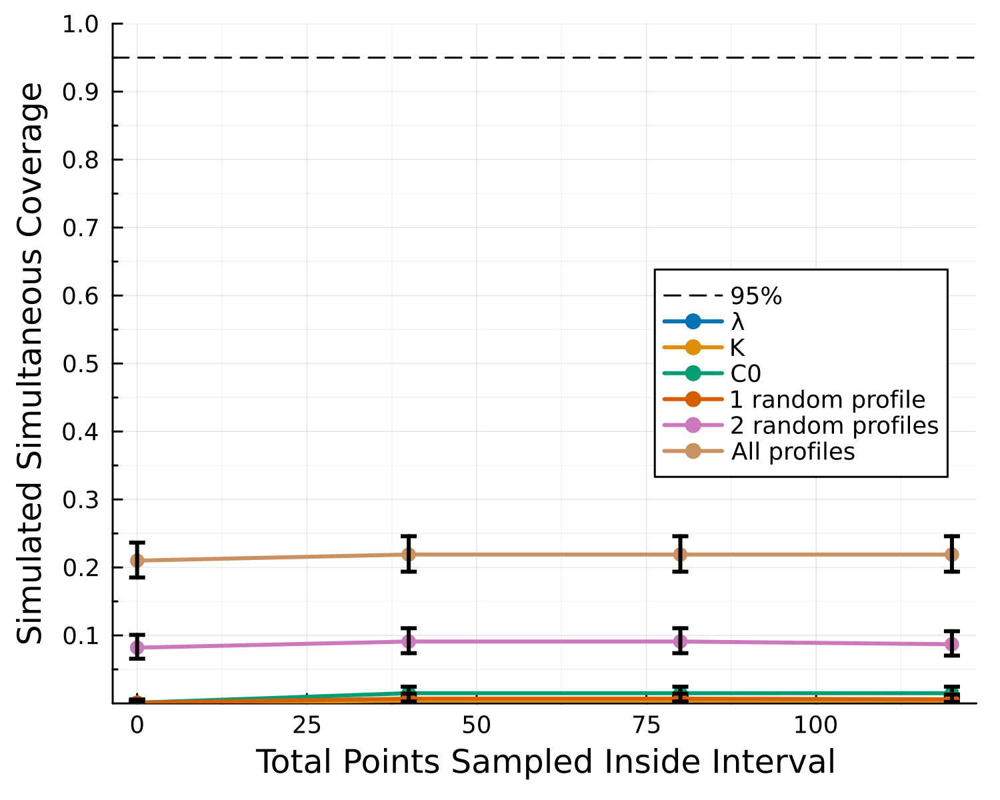

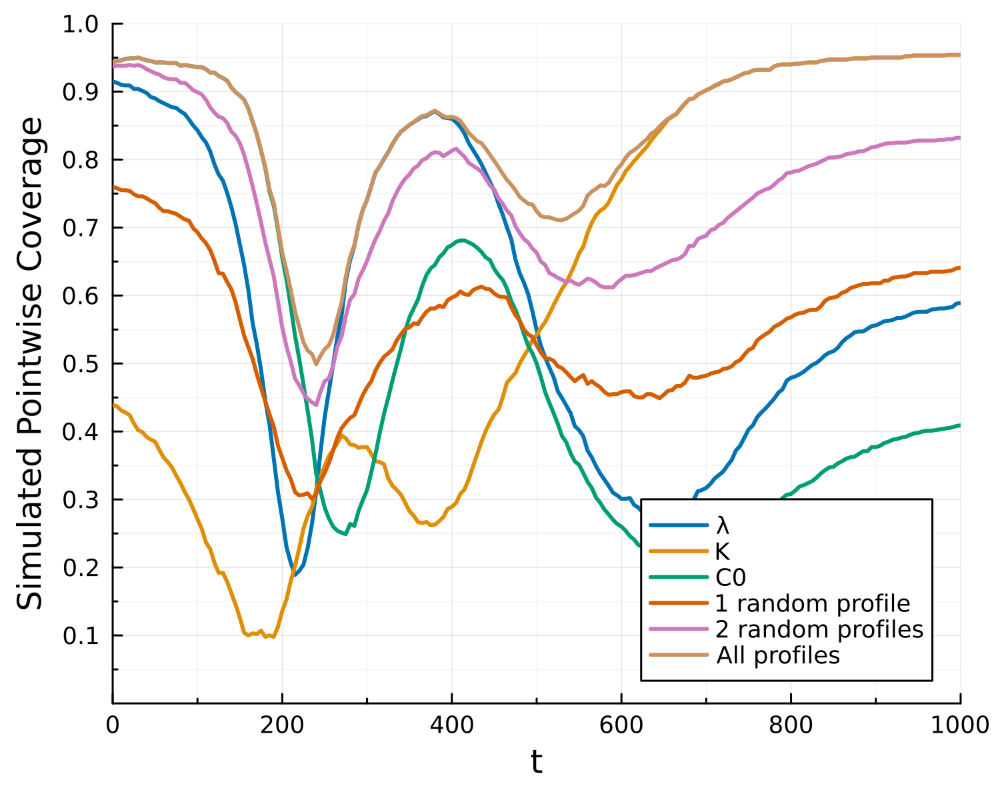

In [17]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = 0:5:1000
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
file_name = "univariate_prediction_coverage.arrow"

data_df = get_data_df(file_name, output_location)

plt = plot_simultaneous_coverage(data_df, legend_position=:right, xlabel="Total Points Sampled Inside Interval")

data_lots_of_pnts = filter(:num_points => ==(120), data_df)
plt = plot_pointwise_coverage(data_lots_of_pnts, t_pred, xlabel="Total Points Sampled Inside Interval");

Simultaneous threshold

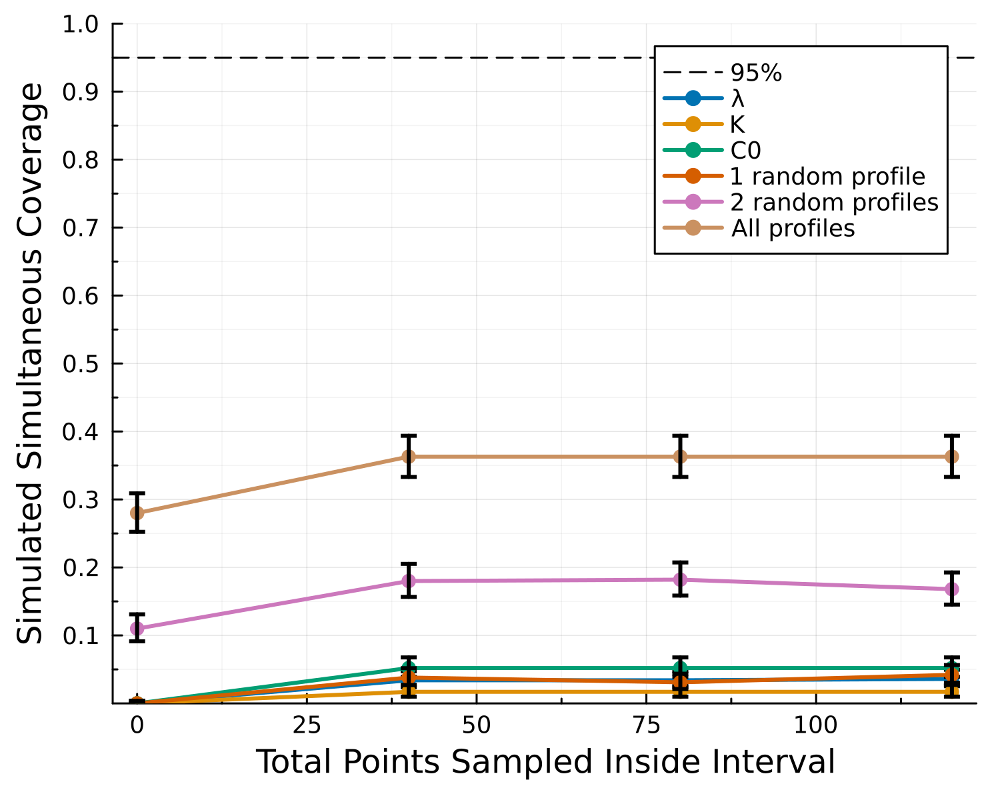

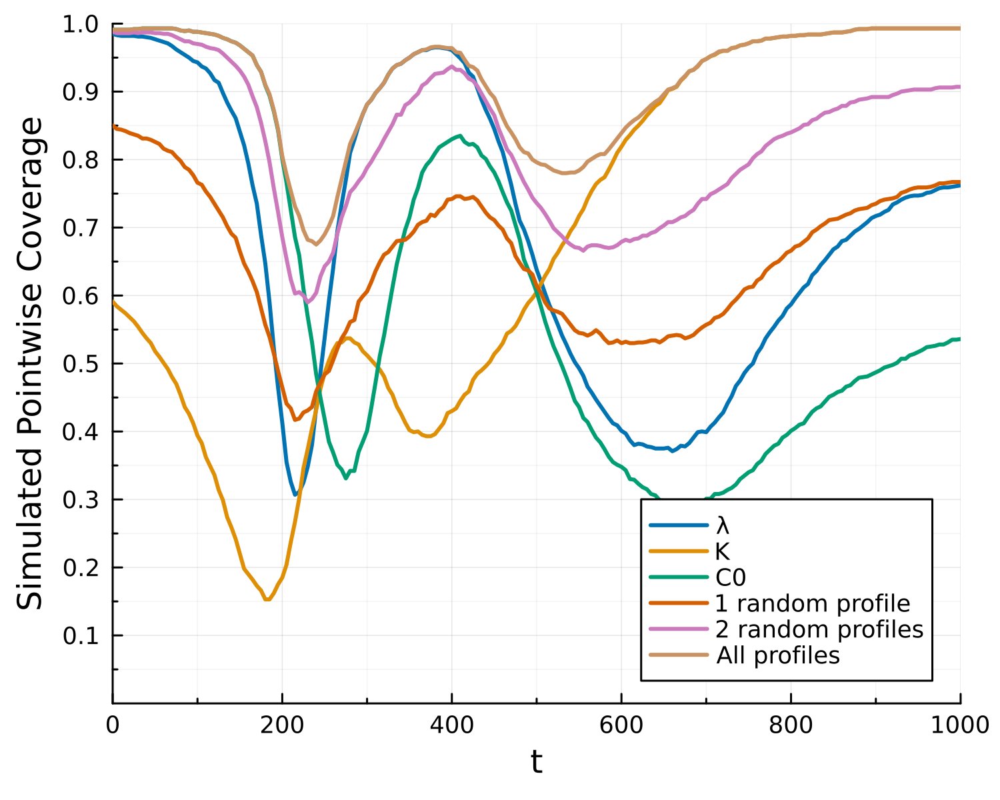

In [18]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = 0:5:1000
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);

file_name = "univariate_prediction_coverage_simultaneous_threshold.arrow"

data_df = get_data_df(file_name, output_location)

plt = plot_simultaneous_coverage(data_df, legend_position=:topright, xlabel="Total Points Sampled Inside Interval")

data_lots_of_pnts = filter(:num_points => ==(120), data_df)
plt = plot_pointwise_coverage(data_lots_of_pnts, t_pred, xlabel="Total Points Sampled Inside Interval");

#### Bivariate Profiles

Bivariate threshold

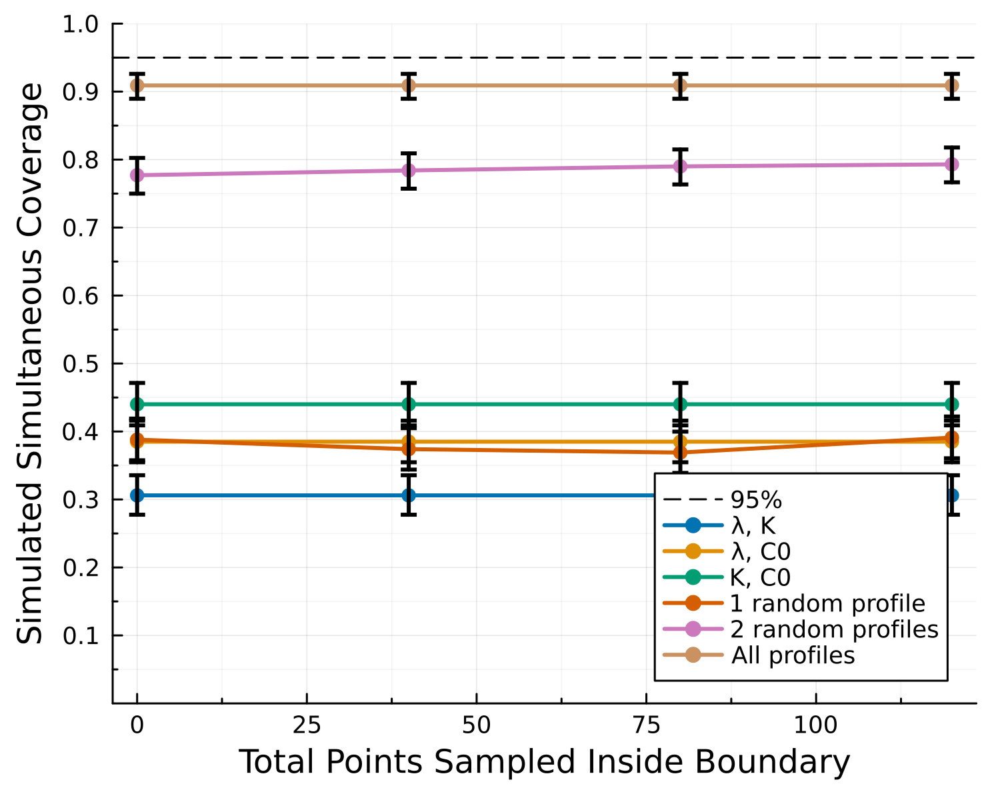

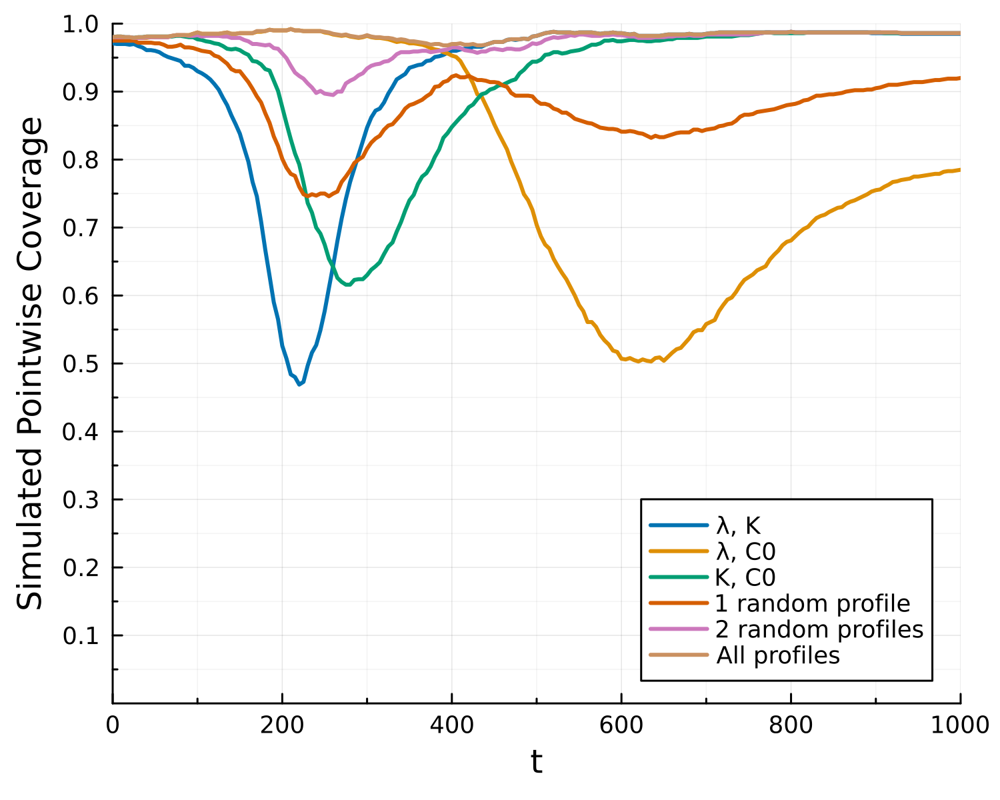

In [19]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = 0:5:1000
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
file_name = "bivariate_prediction_coverage.arrow"

data_df = get_data_df(file_name, output_location)

plt = plot_simultaneous_coverage(data_df, legend_position=:bottomright, xlabel="Total Points Sampled Inside Boundary")

data_lots_of_pnts = filter(:num_points => ==(120), data_df)
plt = plot_pointwise_coverage(data_lots_of_pnts, t_pred, xlabel="Total Points Sampled Inside Boundary");

Simultaneous threshold

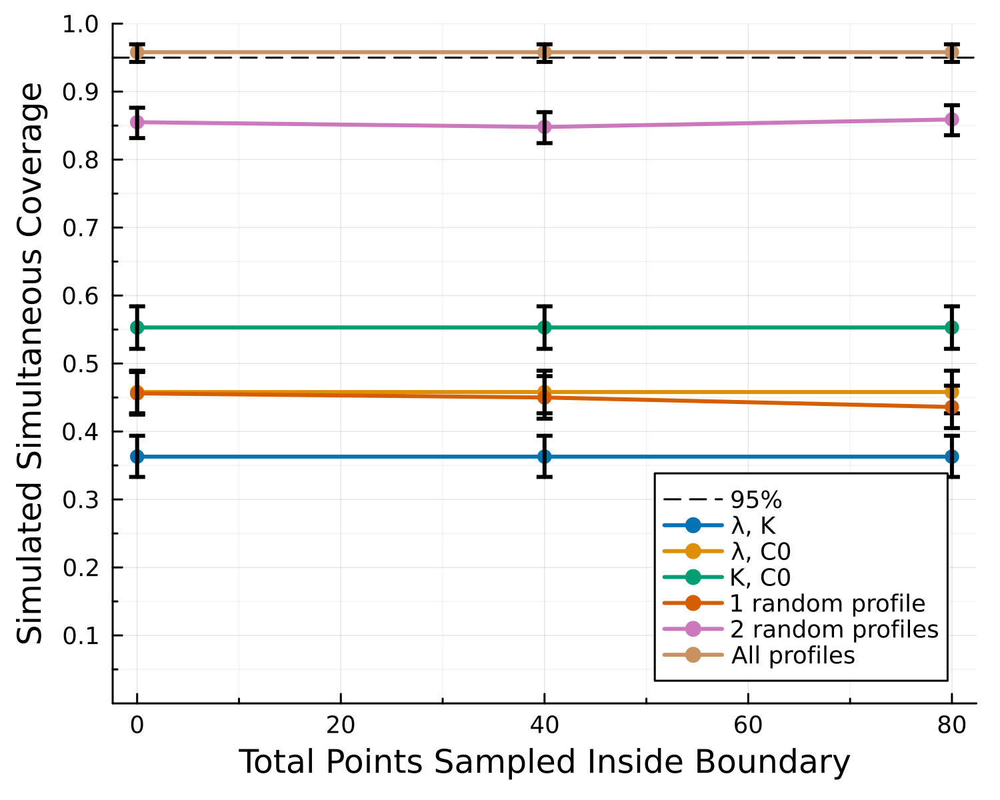

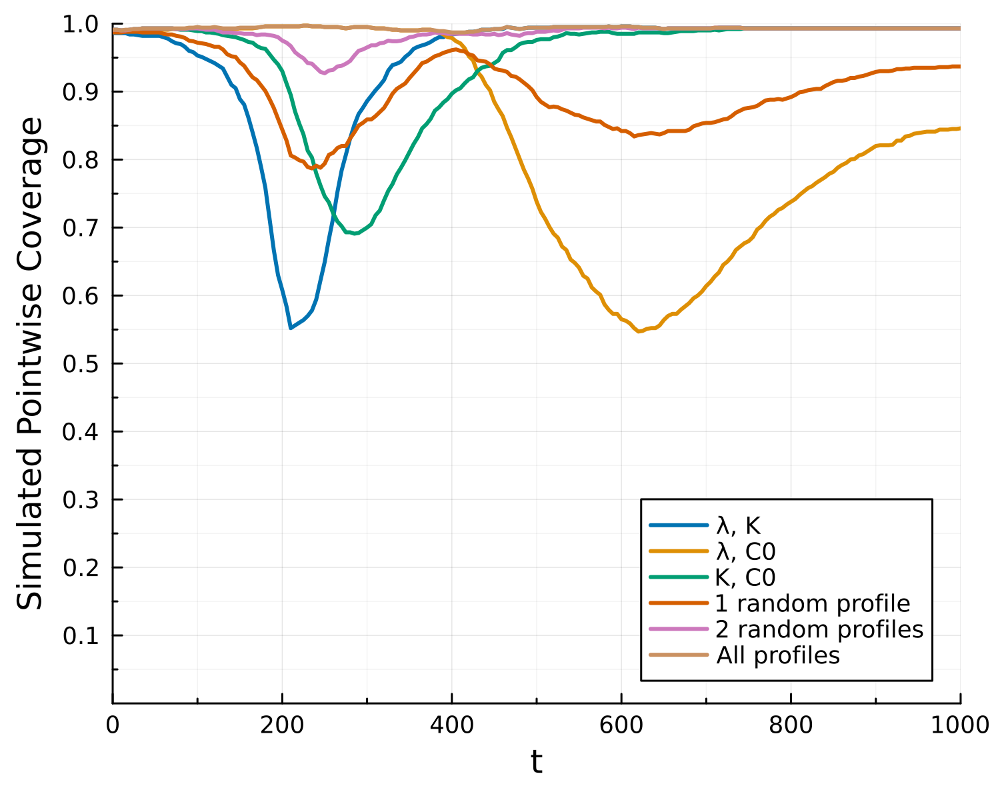

In [24]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = 0:5:1000
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
file_name = "bivariate_prediction_coverage_simultaneous_threshold.arrow"

data_df = get_data_df(file_name, output_location)

plt = plot_simultaneous_coverage(data_df, legend_position=:bottomright, xlabel="Total Points Sampled Inside Boundary")

data_lots_of_pnts = filter(:num_points => ==(80), data_df)
plt = plot_pointwise_coverage(data_lots_of_pnts, t_pred, xlabel="Total Points Sampled Inside Boundary");

Simultaneous threshold with xtol_rel

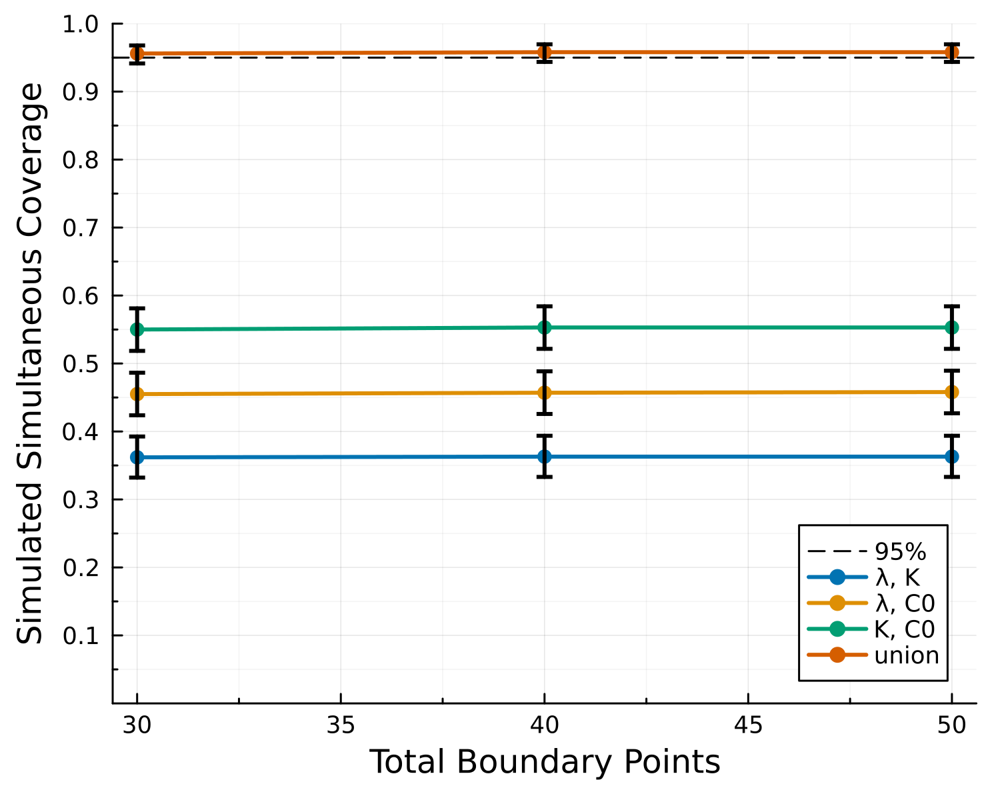

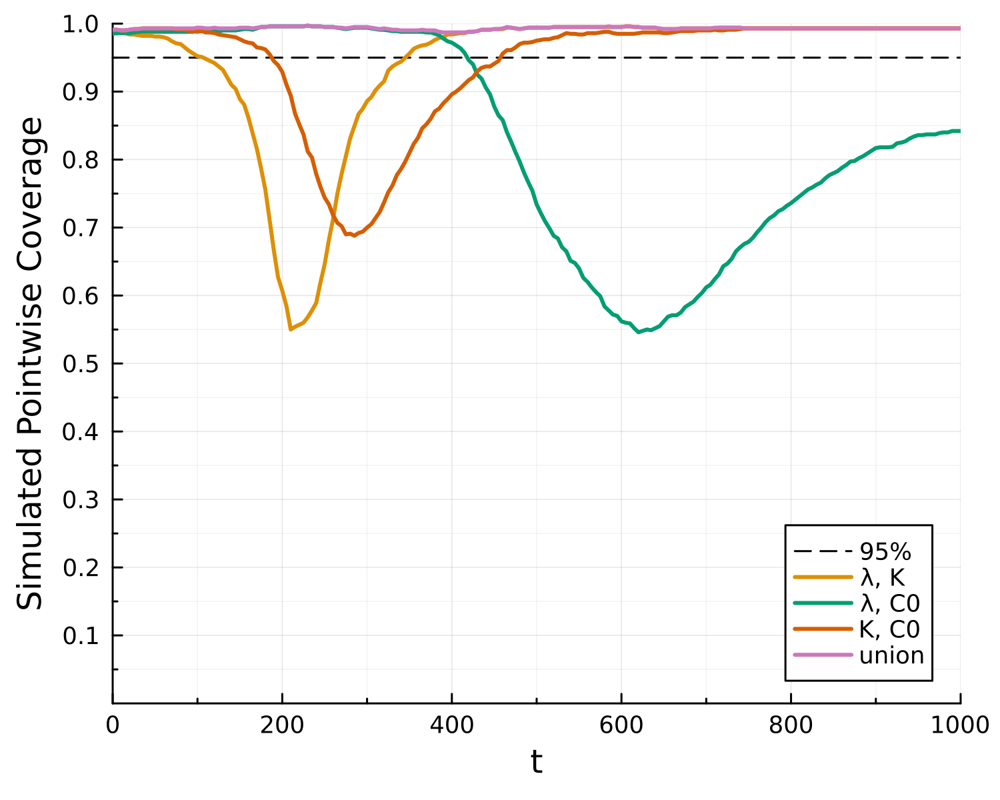

In [27]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = 0:5:1000

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Boundary Points", minorgrid=true, minorticks=2, yticks=0.1:0.1:1.0, ylims=(0.0, 1.0));
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[1];
output_location = joinpath("Outputs", loc);
# data_df = CSV.read(joinpath(output_location, "full_sampling_prediction_coverage.csv"), DataFrame);
data_df = DataFrame(Arrow.Table(joinpath(output_location, "bivariate_prediction_coverage_simultaneous_threshold_xtol_rel.arrow")), copycols=true);

data_df.θname = [replace(strip(string(name), ['[', ']']), ':' => "") for name in data_df.θname]
data_df.θname = categorical(copy(data_df.θname), levels=unique(data_df.θname))
# display(data_df)
plt = plot()
@df data_df plot!(:num_boundary_points, :simultaneous_coverage; group=:θname,
    yerror=(:simultaneous_coverage .- :coverage_lb, :coverage_ub .- :simultaneous_coverage),
    marker=(:circle), ylabel="Simulated Simultaneous Coverage", format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
plt.subplots[1].series_list = [plt.subplots[1].series_list[end]; plt.subplots[1].series_list[1:end-1]]
display(plt)


plt = plot(; format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)

data_lots_of_pnts = filter(:num_boundary_points => ==(30), data_df)
# display(data_lots_of_pnts)
for df in groupby(data_lots_of_pnts, :θname)
    @df df plot!(t_pred, :pointwise_coverage;lw=2, label=:θname[1], xlabel="t",
        ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm)
end
display(plt)

### Lotka Volterra

#### Full Sampling

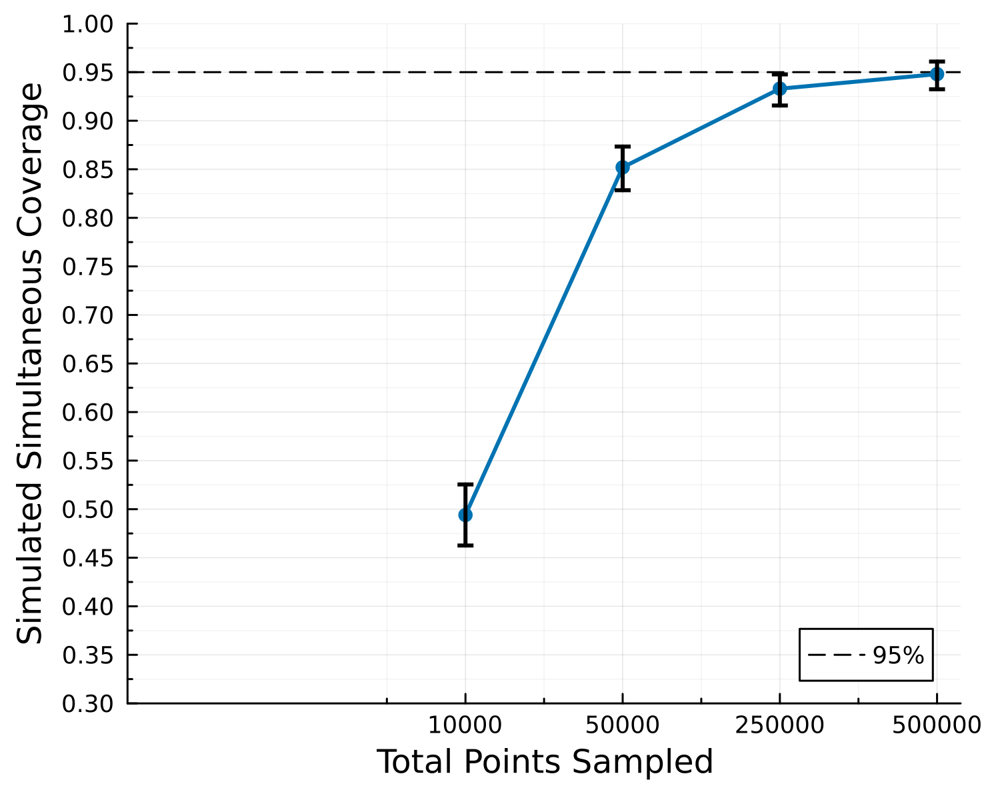

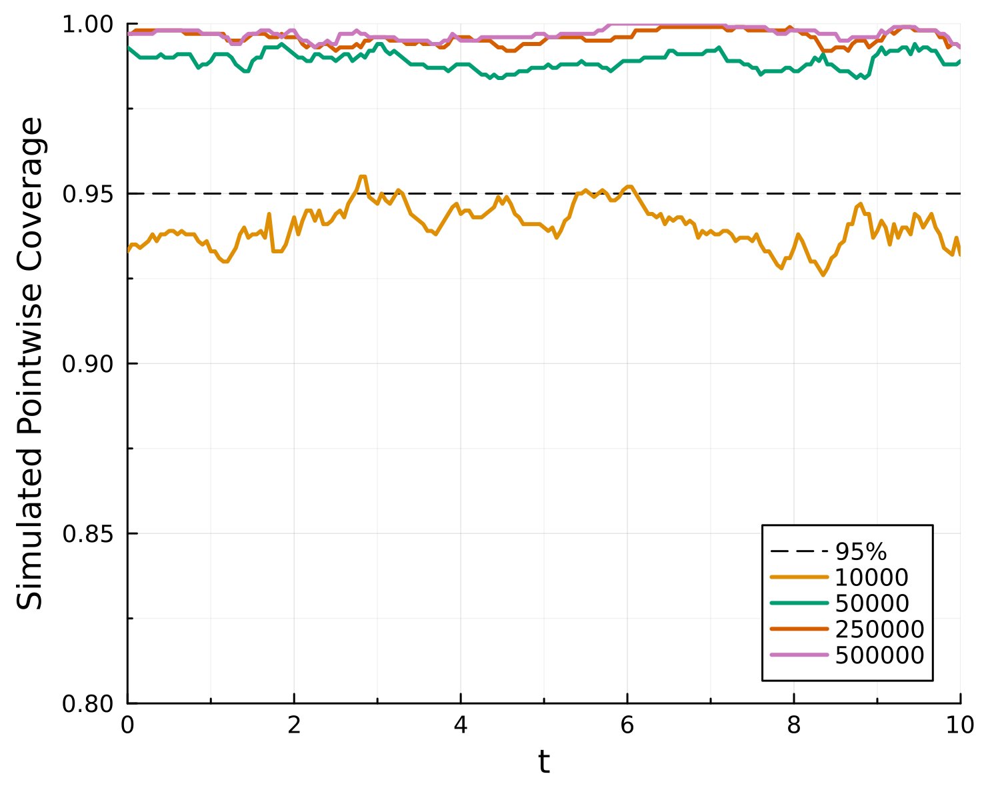

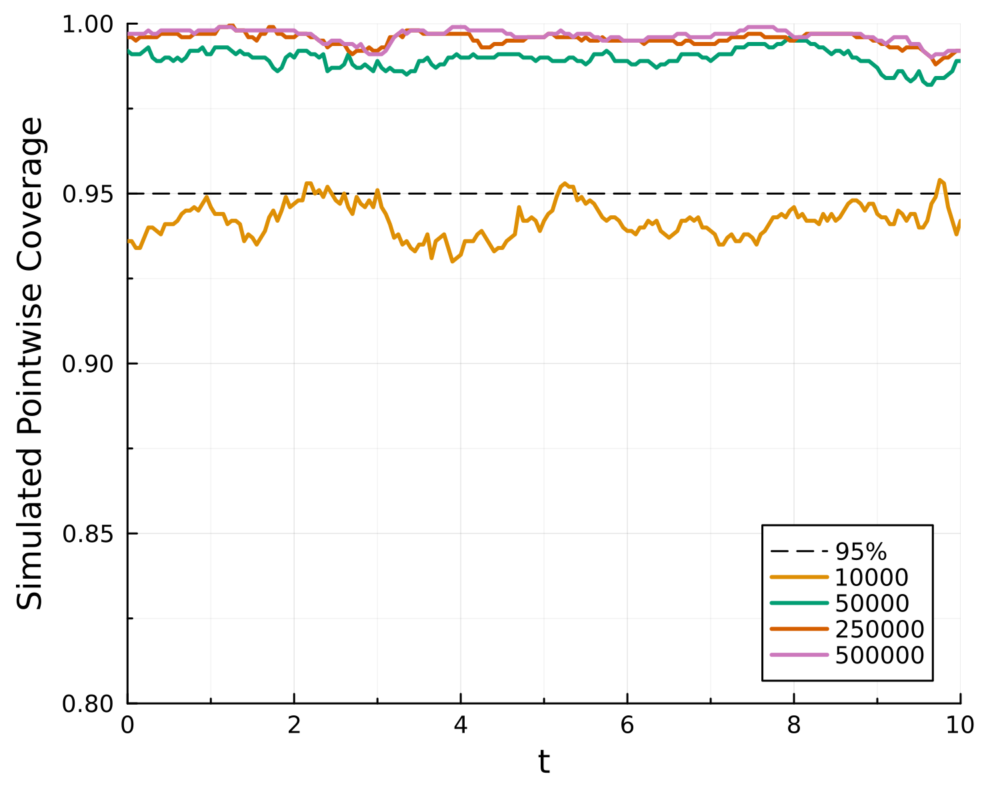

"c:\\Users\\joelt\\Documents\\GitHub\\JuLikelihood_MastersWorking\\Experiments\\Outputs\\lotka_volterra\\pointwise_prediction_coverage_lotka_volterra2.pdf"

In [19]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = LinRange(0, 10, 201)

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Points Sampled", minorgrid=true, minorticks=2, yticks=0.1:0.05:1.0, ylims=(0.8, 1.0));
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[2];
output_location = joinpath("Outputs", loc);
# data_df = CSV.read(joinpath(output_location, "full_sampling_prediction_coverage.csv"), DataFrame);
data_df = DataFrame(Arrow.Table(joinpath(output_location, "full_sampling_prediction_coverage.arrow")), copycols=true);

data_df = filter(:n_random_combinations => ==(0), data_df)
plt = plot()
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
@df data_df plot!(string.(:num_points), :simultaneous_coverage; color=1, label="",
    yerror=(:simultaneous_coverage .- :coverage_lb, :coverage_ub .- :simultaneous_coverage),
    # xticks=[10000, 50000, 250000, 500000],
    rightmargin=3mm,
    marker=(:circle), ylabel="Simulated Simultaneous Coverage", format..., ylims=(0.3, 1.0))
display(plt)

savefig(plt, joinpath(output_location, "simultaneous_prediction_coverage_" * loc * ".pdf"))

# data_good_cov = filter(:num_points => ==(30000), data_df)

data_df.num_points = string.(data_df.num_points)
plt = plot(; format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
for df in groupby(data_df, :num_points)
    @df df plot!(plt, t_pred, :pointwise_coverage[1][1:length(t_pred)]; lw=2, label=:num_points[1], xlabel="t", ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm)
end
display(plt)

savefig(plt, joinpath(output_location, "pointwise_prediction_coverage_" * loc * "1.pdf"))

plt = plot(; format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
for df in groupby(data_df, :num_points)
    @df df plot!(plt, t_pred, :pointwise_coverage[1][length(t_pred)+1:end]; lw=2, label=:num_points[1], xlabel="t", ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm)
end
display(plt)

savefig(plt, joinpath(output_location, "pointwise_prediction_coverage_" * loc * "2.pdf"))

#### Univariate Profiles

Univariate confidence threshold

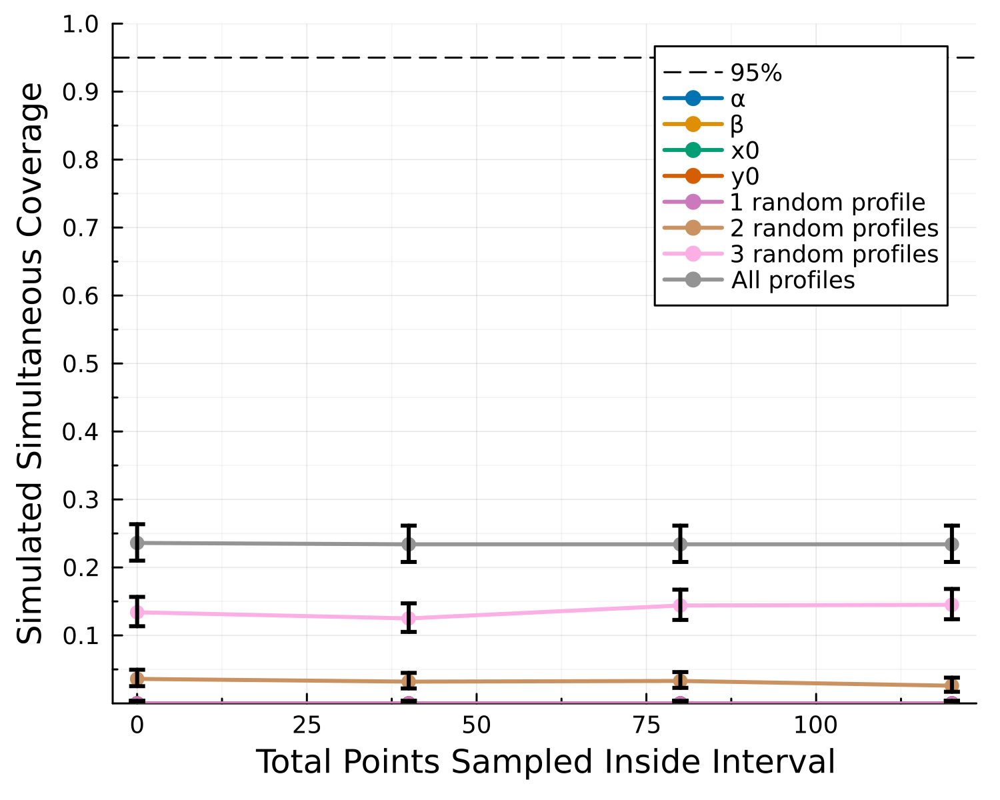

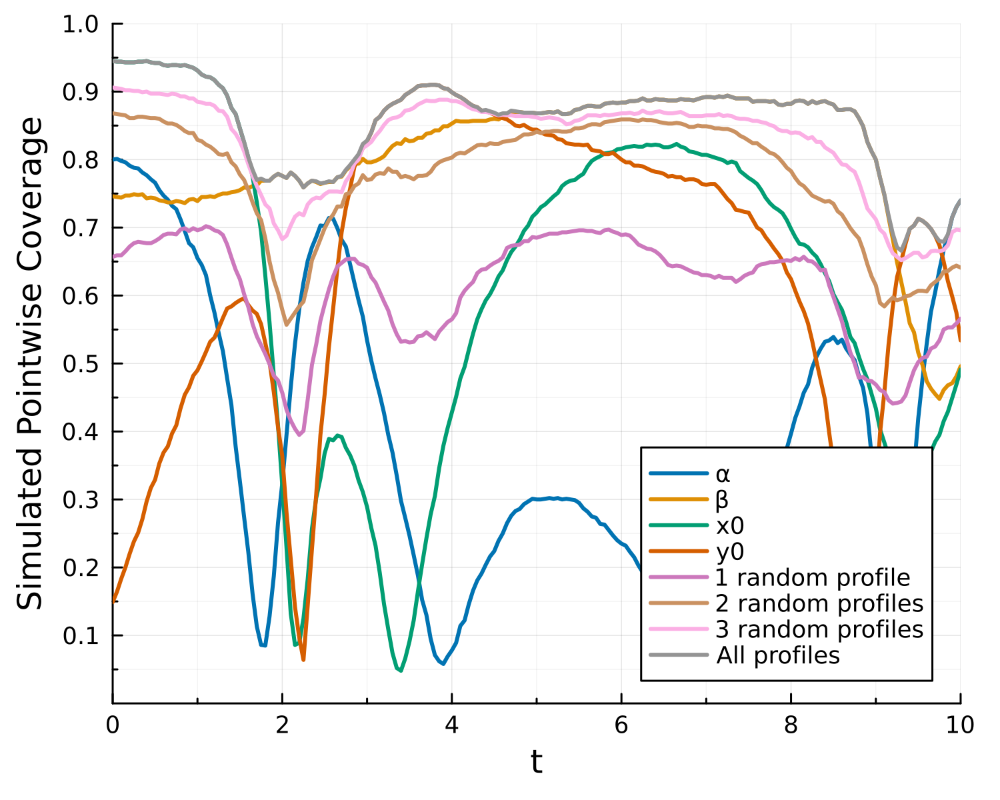

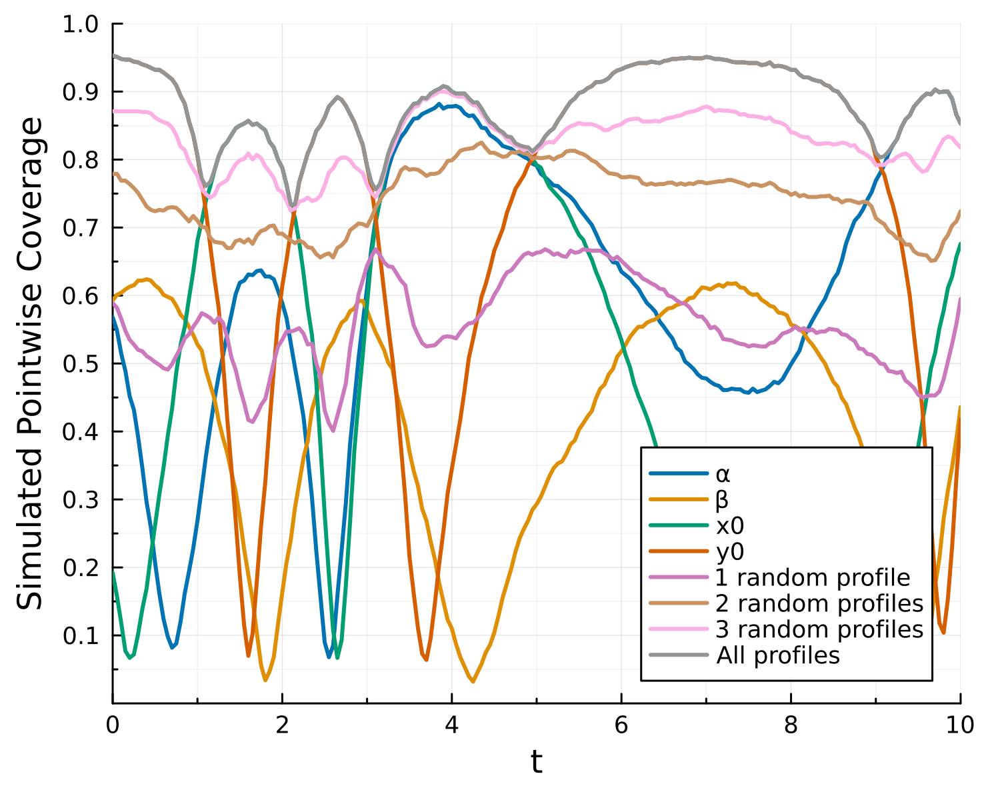

(Plot{Plots.GRBackend() n=8}, Plot{Plots.GRBackend() n=8})

In [44]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = LinRange(0, 10, 201)

locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

file_name = "univariate_prediction_coverage.arrow"

data_df = get_data_df(file_name, output_location)

plt = plot_simultaneous_coverage(data_df, legend_position=:topright, xlabel="Total Points Sampled Inside Interval")

data_lots_of_pnts = filter(:num_points => ==(120), data_df)
plt = plot_pointwise_coverage(data_lots_of_pnts, t_pred, true, xlabel="Total Points Sampled Inside Interval");


Simultaneous threshold

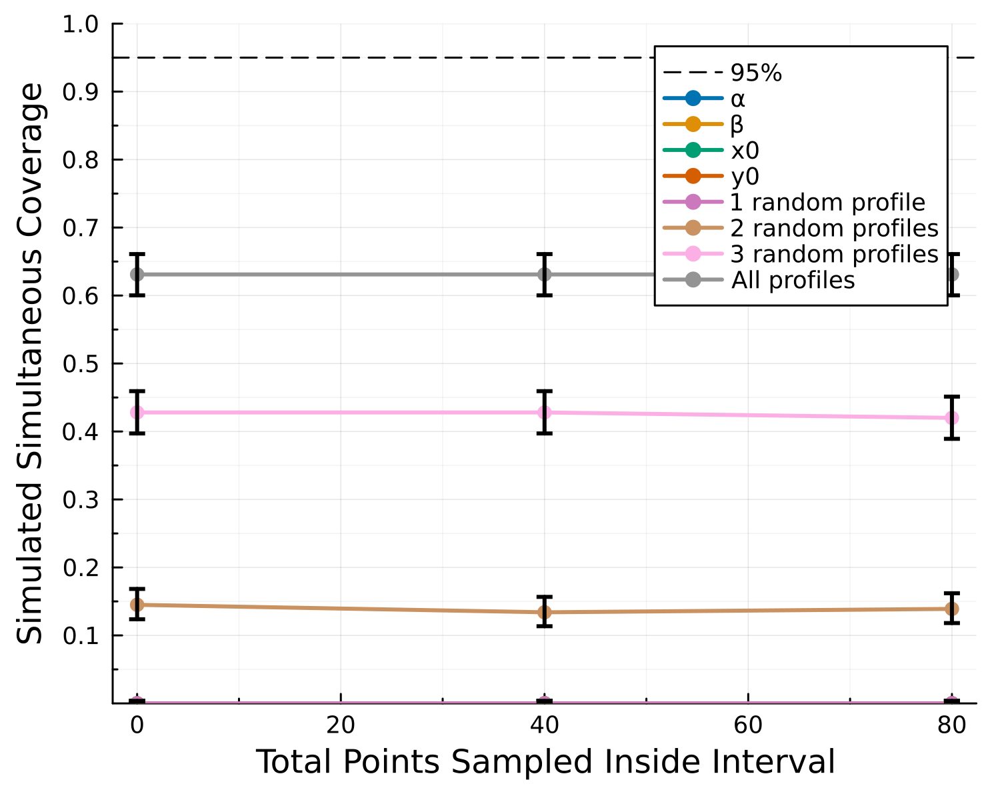

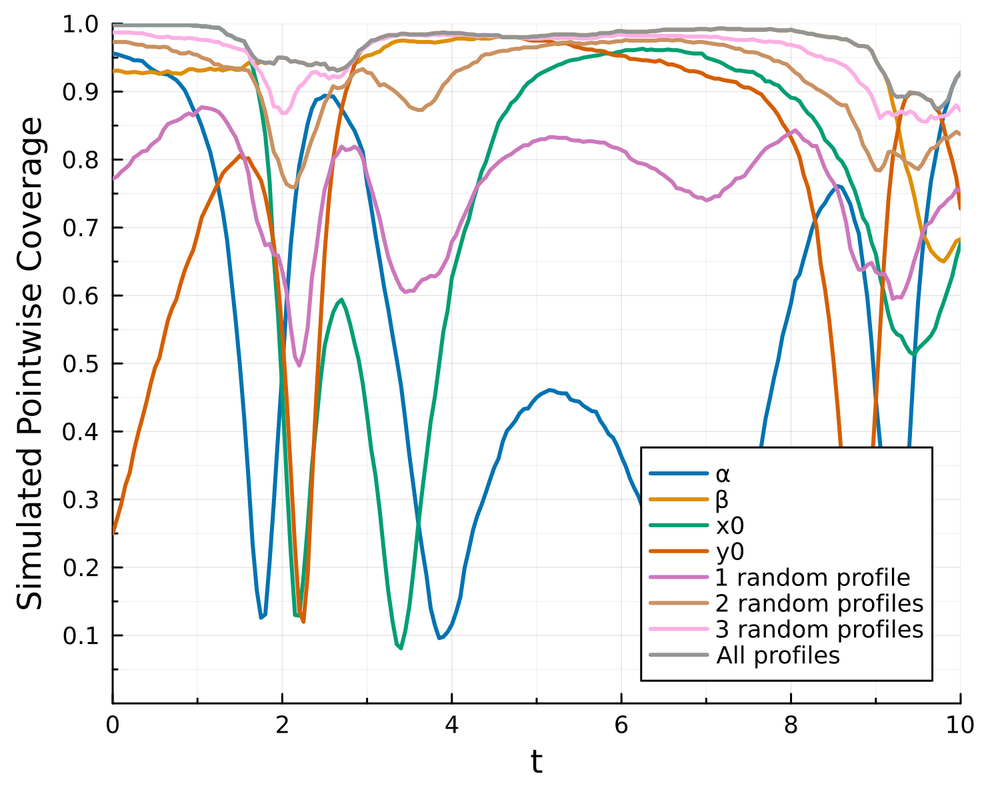

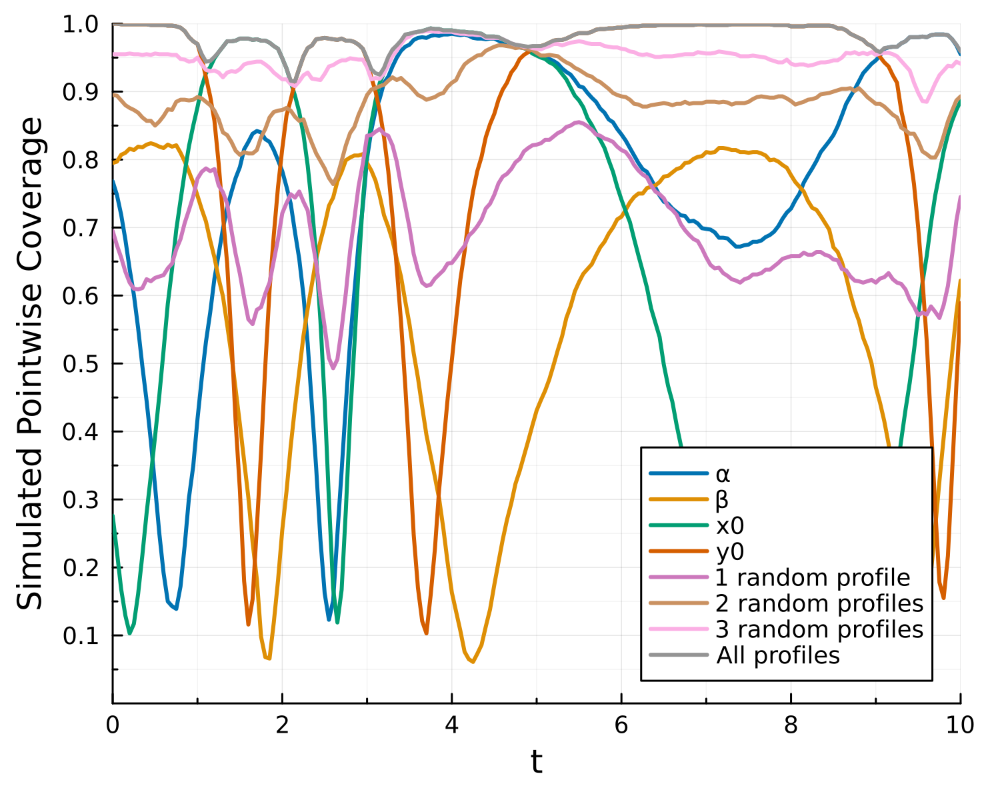

In [46]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = LinRange(0, 10, 201)
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[2];
output_location = joinpath("Outputs", loc);

file_name = "univariate_prediction_coverage_simultaneous_threshold.arrow"

data_df = get_data_df(file_name, output_location)

plt = plot_simultaneous_coverage(data_df, legend_position=:topright, xlabel="Total Points Sampled Inside Interval")

data_lots_of_pnts = filter(:num_points => ==(80), data_df)
plt = plot_pointwise_coverage(data_lots_of_pnts, t_pred, true, xlabel="Total Points Sampled Inside Interval");

#### Bivariate Profiles

Bivariate threshold

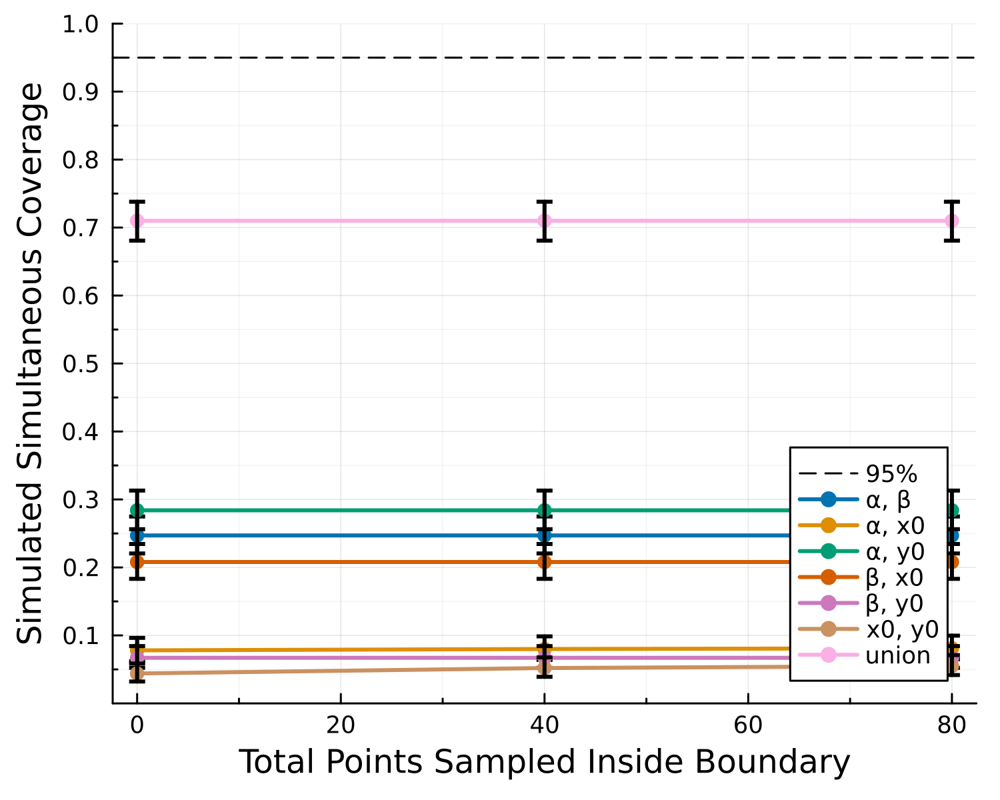

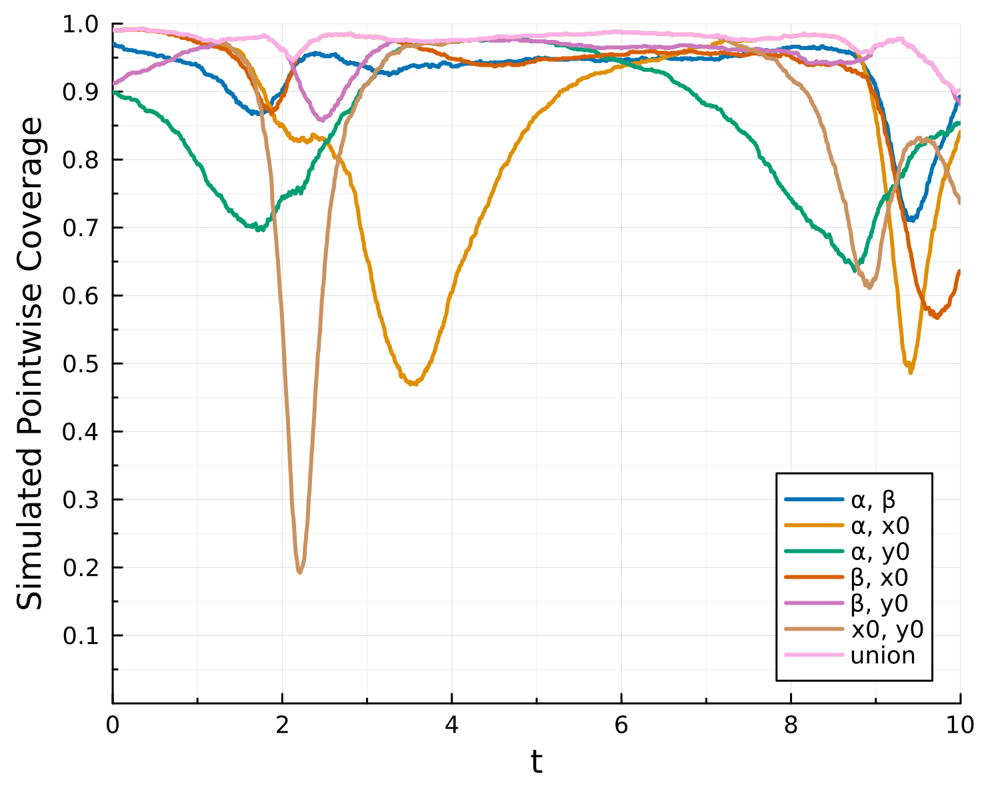

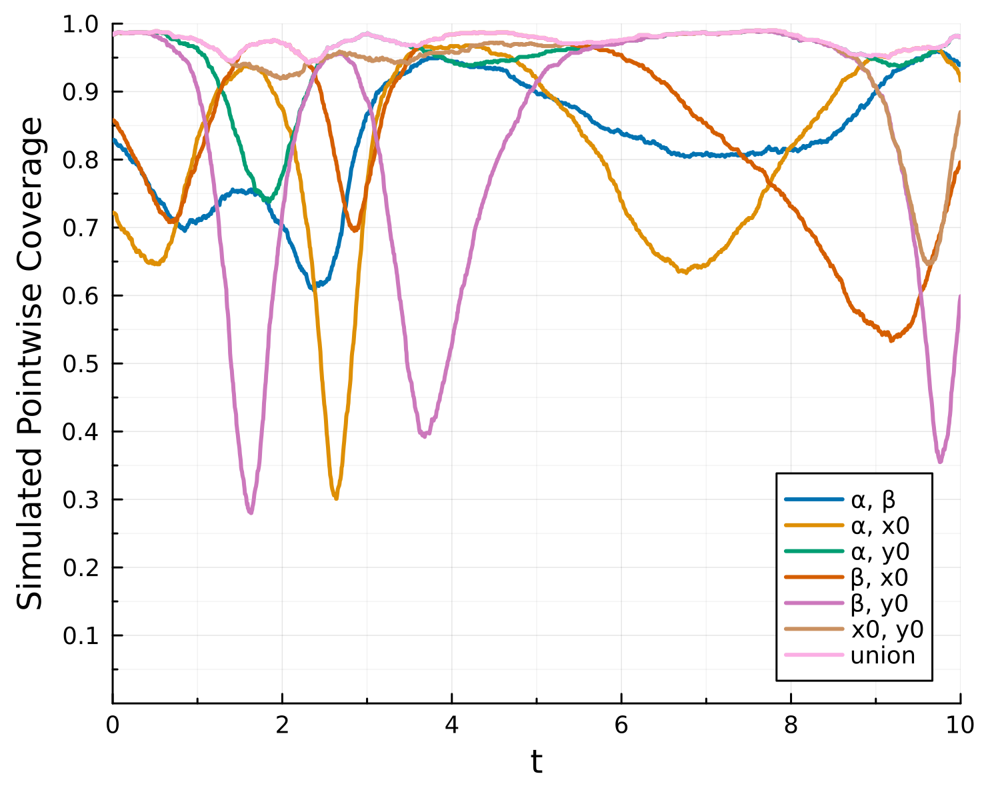

In [17]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = LinRange(0, 10, 2001)

format = (palette=:seaborn_colorblind, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Points Sampled Inside Boundary", minorgrid=true, minorticks=2, yticks=0.1:0.1:1.0, ylims=(0.0, 1.0));
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[2];
output_location = joinpath("Outputs", loc);
# data_df = CSV.read(joinpath(output_location, "full_sampling_prediction_coverage.csv"), DataFrame);
data_df = DataFrame(Arrow.Table(joinpath(output_location, "bivariate_prediction_coverage.arrow")), copycols=true);

data_df = filter(:n_random_combinations => ==(0), data_df)
data_df.θname = [replace(strip(string(name), ['[', ']']), ':' => "") for name in data_df.θname]
data_df.θname = categorical(copy(data_df.θname), levels=unique(data_df.θname))

plt = plot()
@df data_df plot!(:num_points, :simultaneous_coverage; group=:θname,
    yerror=(:simultaneous_coverage .- :coverage_lb, :coverage_ub .- :simultaneous_coverage),
    marker=(:circle), ylabel="Simulated Simultaneous Coverage", format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
plt.subplots[1].series_list = [plt.subplots[1].series_list[end]; plt.subplots[1].series_list[1:end-1]]
display(plt)

data_lots_of_pnts = filter(:num_points => ==(0), data_df)
plt = plot(; format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
for df in groupby(data_lots_of_pnts, :θname)
    @df df plot!(plt, t_pred, :pointwise_coverage[1][1:length(t_pred)];lw=2, label=:θname[1], xlabel="t",
        ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, lw=2)
end
display(plt)

plt = plot(; format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
for df in groupby(data_lots_of_pnts, :θname)
    @df df plot!(plt, t_pred, :pointwise_coverage[1][(length(t_pred)+1):end];lw=2, label=:θname[1], xlabel="t",
        ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, lw=2)
end
display(plt)

Simultaneous threshold

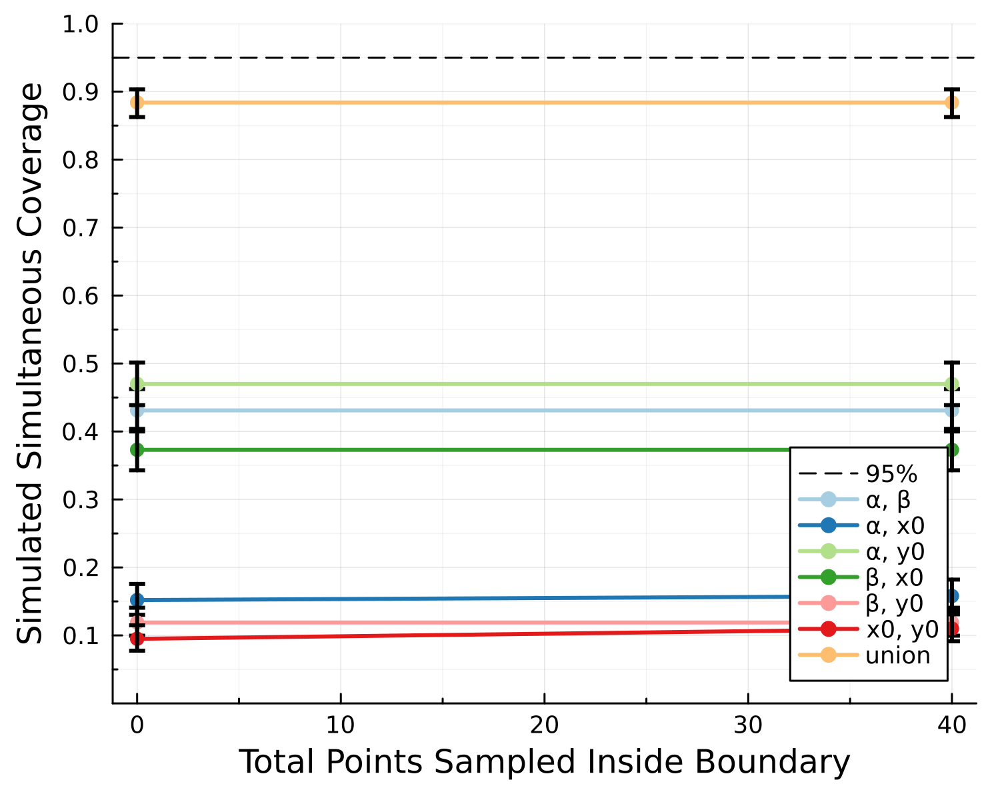

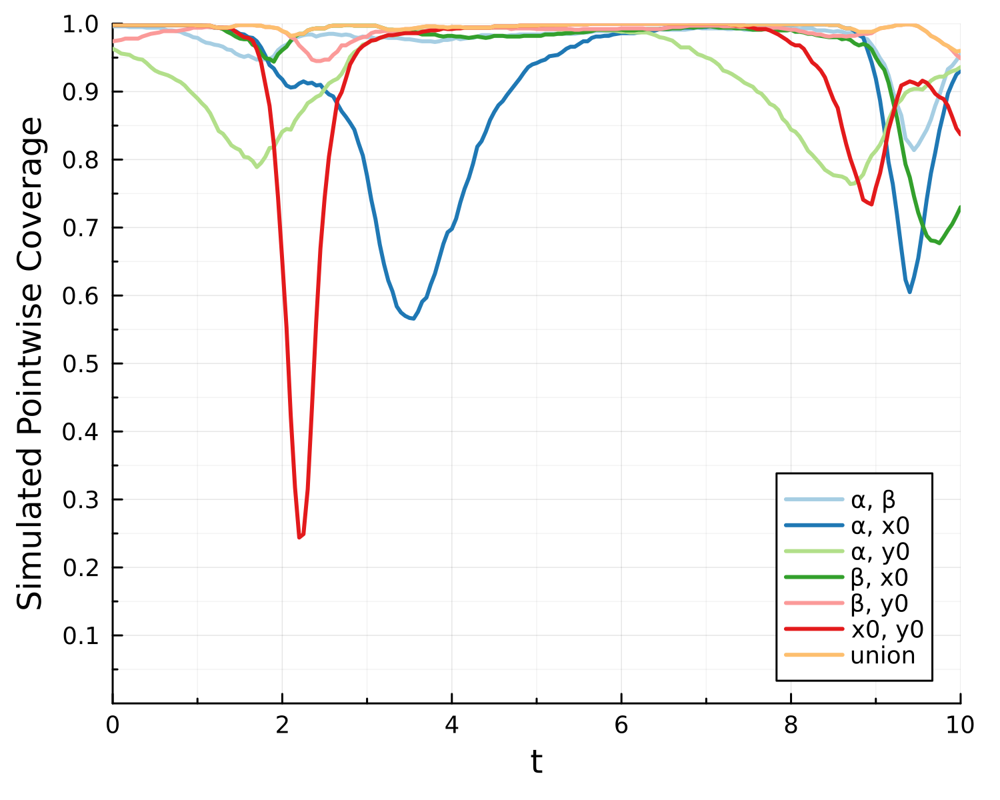

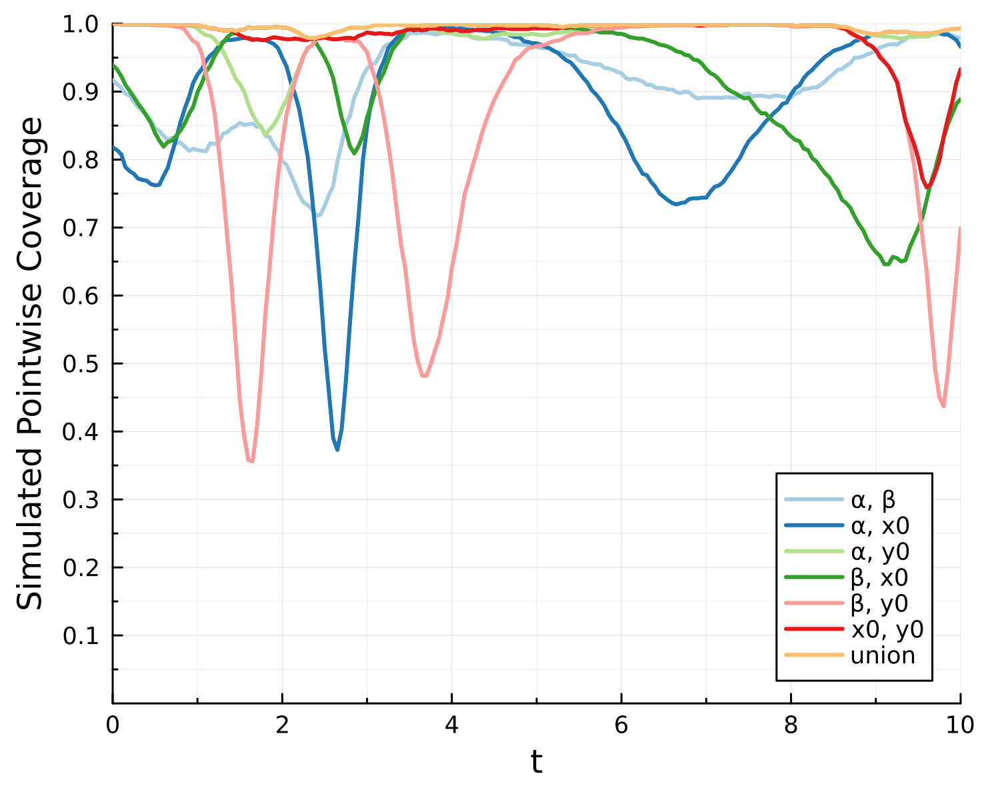

In [5]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = LinRange(0, 10, 201)

format = (palette=:Paired, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Points Sampled Inside Boundary", minorgrid=true, minorticks=2, yticks=0.1:0.1:1.0, ylims=(0.0, 1.0));
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[2];
output_location = joinpath("Outputs", loc);
# data_df = CSV.read(joinpath(output_location, "full_sampling_prediction_coverage.csv"), DataFrame);
data_df = DataFrame(Arrow.Table(joinpath(output_location, "bivariate_prediction_coverage_simultaneous_threshold.arrow")), copycols=true);

data_df = filter(:n_random_combinations => ==(0), data_df)
data_df.θname = [replace(strip(string(name), ['[', ']']), ':' => "") for name in data_df.θname]
data_df.θname = categorical(copy(data_df.θname), levels=unique(data_df.θname))

plt = plot()
@df data_df plot!(:num_points, :simultaneous_coverage; group=:θname,
    yerror=(:simultaneous_coverage .- :coverage_lb, :coverage_ub .- :simultaneous_coverage),
    marker=(:circle), ylabel="Simulated Simultaneous Coverage", format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
plt.subplots[1].series_list = [plt.subplots[1].series_list[end]; plt.subplots[1].series_list[1:end-1]]
display(plt)

data_lots_of_pnts = filter(:num_points => ==(0), data_df)
plt = plot(; format...)
for df in groupby(data_lots_of_pnts, :θname)
    @df df plot!(plt, t_pred, :pointwise_coverage[1][1:length(t_pred)]; label=:θname[1], xlabel="t",
        ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, lw=2)
end
display(plt)

plt = plot(; format...)
for df in groupby(data_lots_of_pnts, :θname)
    @df df plot!(plt, t_pred, :pointwise_coverage[1][(length(t_pred)+1):end]; label=:θname[1], xlabel="t",
        ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, lw=2)
end
display(plt)

Simultaneous with only selected profiles

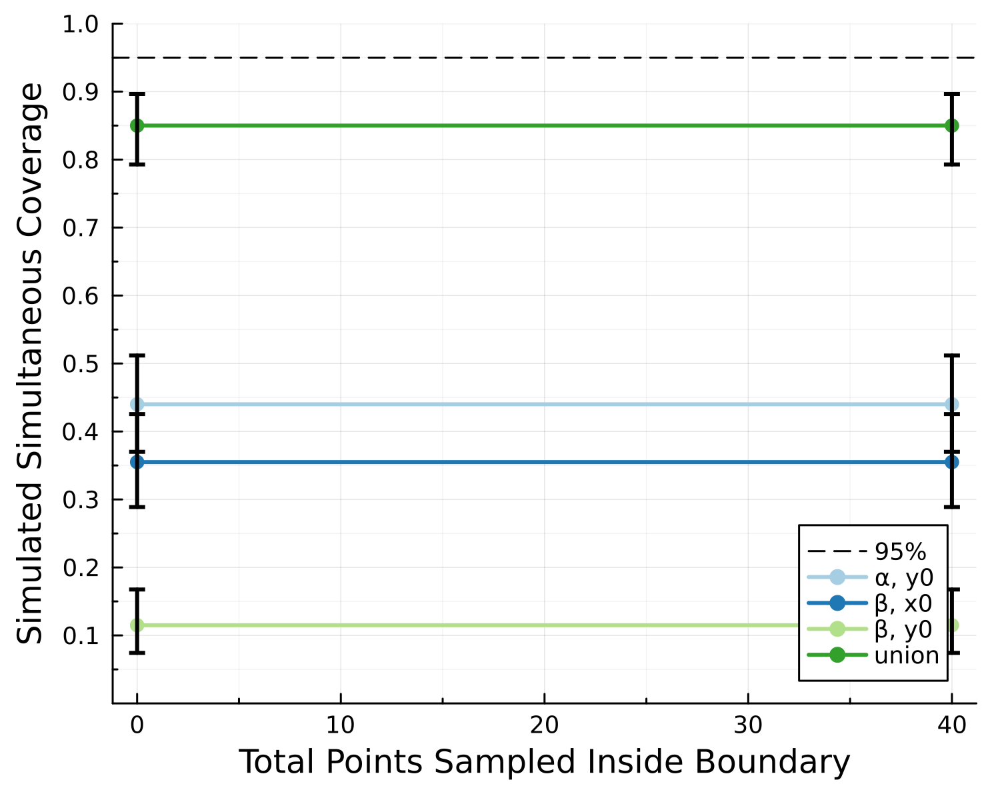

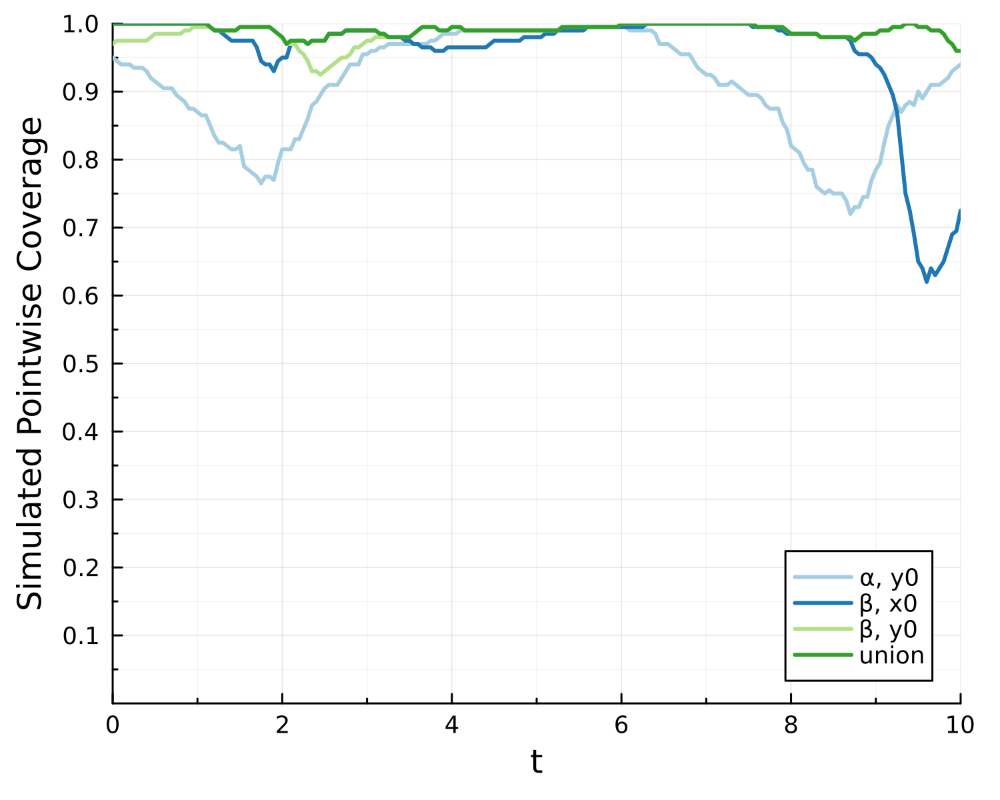

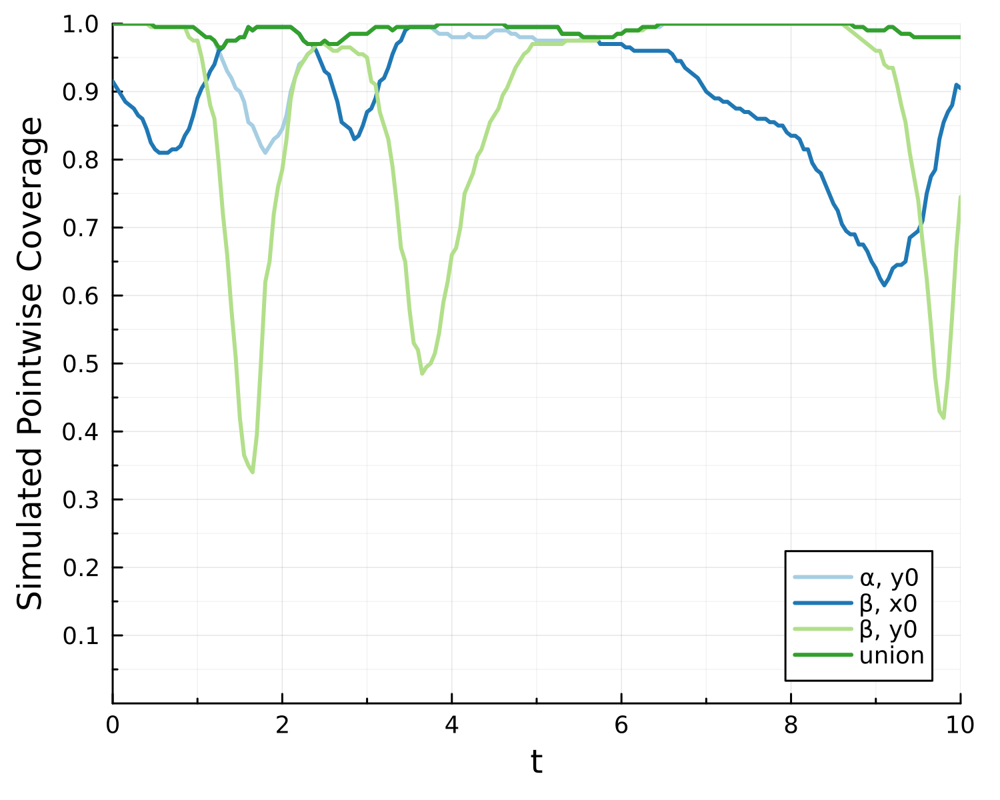

In [9]:
using DataFrames, Arrow
using Plots, StatsPlots;
using Plots.PlotMeasures
gr();
using LaTeXStrings
using CategoricalArrays

t_pred = LinRange(0, 10, 201)

format = (palette=:Paired, lw=2, size=(500, 400), dpi=300, title="", msw=0, mw=4, legend_position=:bottomright, xlabel="Total Points Sampled Inside Boundary", minorgrid=true, minorticks=2, yticks=0.1:0.1:1.0, ylims=(0.0, 1.0));
locs = ["logistic", "lotka_volterra", "logistic_twospecies"];

loc = locs[2];
output_location = joinpath("Outputs", loc);
# data_df = CSV.read(joinpath(output_location, "full_sampling_prediction_coverage.csv"), DataFrame);
data_df = DataFrame(Arrow.Table(joinpath(output_location, "bivariate_prediction_coverage_simultaneous_threshold_two_combinations.arrow")), copycols=true);

data_df = filter(:n_random_combinations => ==(0), data_df)
data_df.θname = [replace(strip(string(name), ['[', ']']), ':' => "") for name in data_df.θname]
data_df.θname = categorical(copy(data_df.θname), levels=unique(data_df.θname))

plt = plot()
@df data_df plot!(:num_points, :simultaneous_coverage; group=:θname,
    yerror=(:simultaneous_coverage .- :coverage_lb, :coverage_ub .- :simultaneous_coverage),
    marker=(:circle), ylabel="Simulated Simultaneous Coverage", format...)
hline!(plt, [0.95], linestyle=:dash, label="95%", color=:black)
plt.subplots[1].series_list = [plt.subplots[1].series_list[end]; plt.subplots[1].series_list[1:end-1]]
display(plt)

data_lots_of_pnts = filter(:num_points => ==(0), data_df)
plt = plot(; format...)
for df in groupby(data_lots_of_pnts, :θname)
    @df df plot!(plt, t_pred, :pointwise_coverage[1][1:length(t_pred)]; label=:θname[1], xlabel="t",
        ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, lw=2)
end
display(plt)

plt = plot(; format...)
for df in groupby(data_lots_of_pnts, :θname)
    @df df plot!(plt, t_pred, :pointwise_coverage[1][(length(t_pred)+1):end]; label=:θname[1], xlabel="t",
        ylabel="Simulated Pointwise Coverage", xlims=(t_pred[1], t_pred[end]), rightmargin=3mm, lw=2)
end
display(plt)